In [1]:
import os
import sys
from pathlib import Path

import numpy as np

# Fixed100 analysis configuration
# Find the repository root from the notebook kernel's working directory.
ROOT = next(parent for parent in (Path.cwd(), *Path.cwd().parents) if (parent / "pyproject.toml").exists())
if str(ROOT) not in sys.path:
    sys.path.append(str(ROOT))

notebook = "fixed100_Abalone"
ANALYSIS_STORE = ROOT / "diagnosis" / "store" / notebook
BASE_STORE = ANALYSIS_STORE.parent

DATA_TAG = notebook
LONG_METHOD = "default_long"

SHORT_METHODS = ["default", "default_pt", "mtmh", "mtmh_pt"]

def _prediction_run_ids(method):
    pattern = f"{DATA_TAG}__run*__{method}__preds.csv"
    return {int(path.name.split("__run", 1)[1].split("__", 1)[0]) for path in (BASE_STORE / DATA_TAG / "preds").glob(pattern)}

LONG_RUN_IDS = sorted(_prediction_run_ids(LONG_METHOD))
short_run_sets = [_prediction_run_ids(method) for method in SHORT_METHODS]
SHORT_RUN_IDS = sorted(set.intersection(*short_run_sets)) if short_run_sets else []
PAIRED_RUN_IDS = sorted(set(LONG_RUN_IDS) & set(SHORT_RUN_IDS))

LONG_BURN_IN = 10
SHORT_BURN_IN = 500

# Draw one reproducible random chain per (run, method) in multi-chain figures.
PLOT_CHAIN_RANDOM_SEED = 2029
PLOT_METHOD_ORDER = [LONG_METHOD, *SHORT_METHODS]

def _random_plot_chain_id(run_id, method, chain_ids):
    if isinstance(run_id, str):
        run_id = int(run_id.rsplit(" ", 1)[-1])
    available = np.asarray(sorted(int(chain_id) for chain_id in chain_ids), dtype=int)
    if available.size == 0:
        raise ValueError(f"No chains available for {method}, run {run_id:03d}.")
    method_index = PLOT_METHOD_ORDER.index(method)
    rng = np.random.default_rng(
        np.random.SeedSequence([PLOT_CHAIN_RANDOM_SEED, int(run_id), method_index])
    )
    return int(rng.choice(available))

print("Loaded config for Abalone:")
print("  BASE_STORE =", BASE_STORE)
print("  DATA_TAG =", DATA_TAG)
print("  LONG_RUN_IDS =", LONG_RUN_IDS)
print("  SHORT_RUN_IDS =", SHORT_RUN_IDS)
print("  PAIRED_RUN_IDS =", PAIRED_RUN_IDS)


Loaded config for Abalone:
  BASE_STORE = c:\Users\ztykk\Phd\BART\bart-playground\diagnosis\store
  DATA_TAG = fixed100_Abalone
  LONG_RUN_IDS = [0, 1, 2, 3, 4]
  SHORT_RUN_IDS = [0, 1, 2]
  PAIRED_RUN_IDS = [0, 1, 2]


In [2]:
# Sanity check: verify available runs in the merged analysis store
import re

def available_runs(method, metric="preds"):
    d = BASE_STORE / DATA_TAG / metric
    if not d.exists():
        return []
    out = []
    for p in d.glob(f"{DATA_TAG}__run*__{method}__{metric}.csv"):
        m = re.search(r"__run(\d{3})__", p.name)
        if m:
            out.append(int(m.group(1)))
    return sorted(set(out))

def available_split_runs(subfolder, suffix):
    d = BASE_STORE / DATA_TAG / subfolder
    if not d.exists():
        return []
    out = []
    for p in d.glob(f"{DATA_TAG}__run*__{suffix}.csv"):
        m = re.search(r"__run(\d{3})__", p.name)
        if m:
            out.append(int(m.group(1)))
    return sorted(set(out))

print("default_long:", available_runs("default_long"))
print("default:", available_runs("default"))
print("default_pt:", available_runs("default_pt"))
print("mtmh:", available_runs("mtmh"))
print("mtmh_pt:", available_runs("mtmh_pt"))
print("indices:", available_split_runs("indices", "train_idx"))
print("subsample_X:", available_split_runs("subsample_X_test", "subsample_X_test"))
print("subsample_y:", available_split_runs("subsample_y_test", "subsample_y_test"))


default_long: [0, 1, 2, 3, 4]
default: [0, 1, 2]
default_pt: [0, 1, 2]
mtmh: [0, 1, 2]
mtmh_pt: [0, 1, 2]
indices: [0, 1, 2]
subsample_X: [0, 1, 2]
subsample_y: [0, 1, 2]


# Long chain behavior

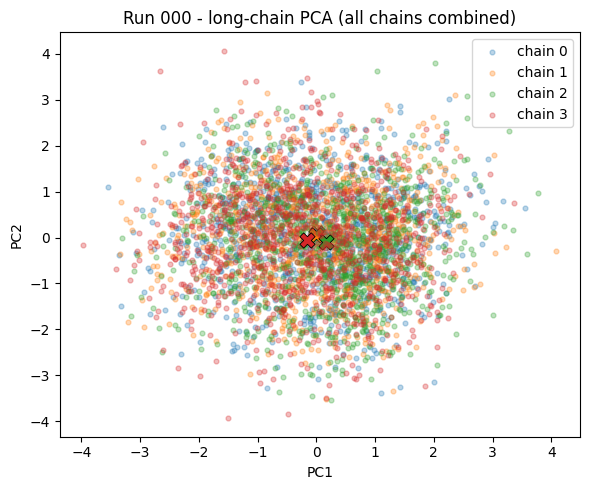

Run 000 centroids (PC1, PC2):
  chain 0: (0.0037, 0.0908)
  chain 1: (-0.0101, 0.0567)
  chain 2: (0.1665, -0.1011)
  chain 3: (-0.1601, -0.0464)


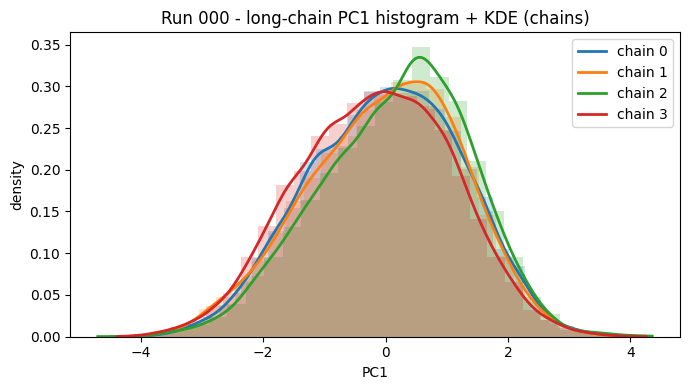

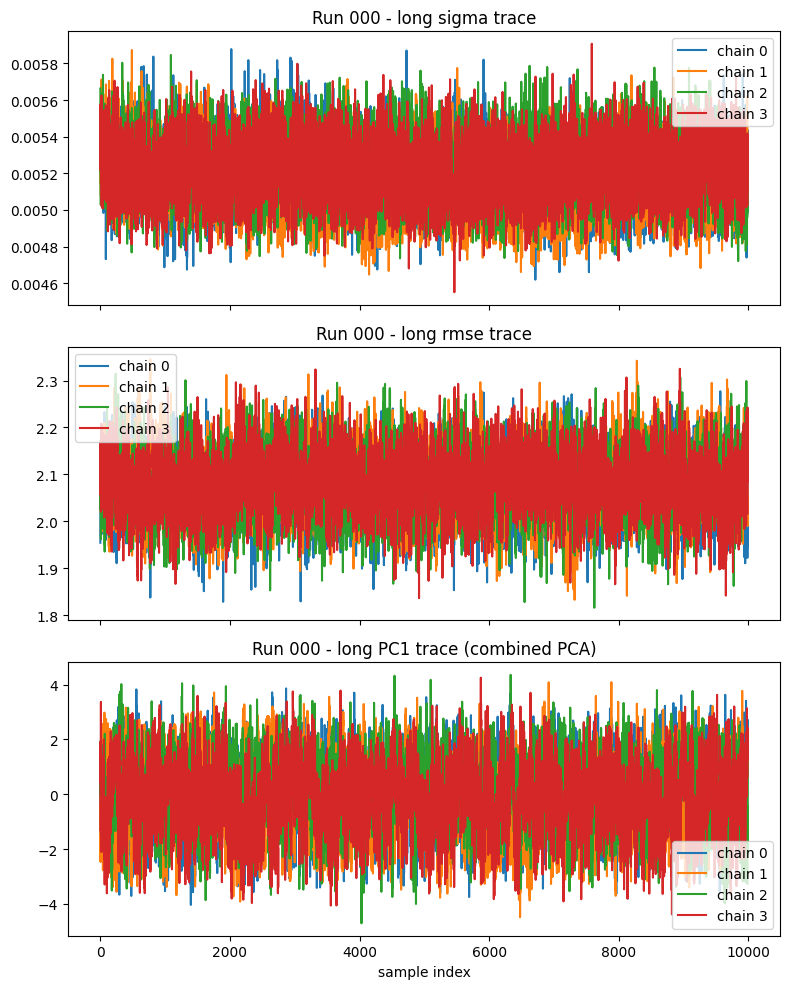

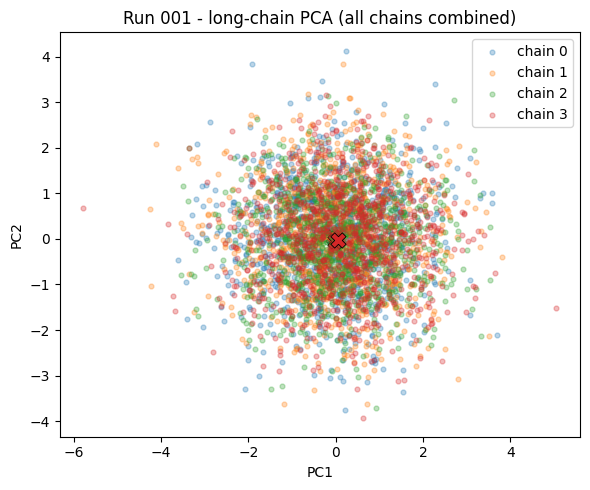

Run 001 centroids (PC1, PC2):
  chain 0: (-0.0590, 0.0334)
  chain 1: (0.0114, 0.0293)
  chain 2: (-0.0117, -0.0391)
  chain 3: (0.0593, -0.0236)


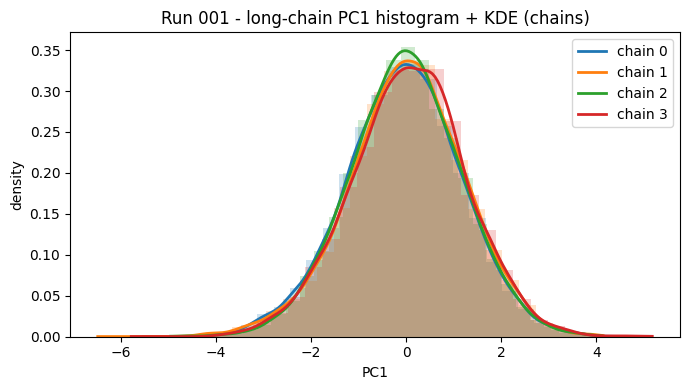

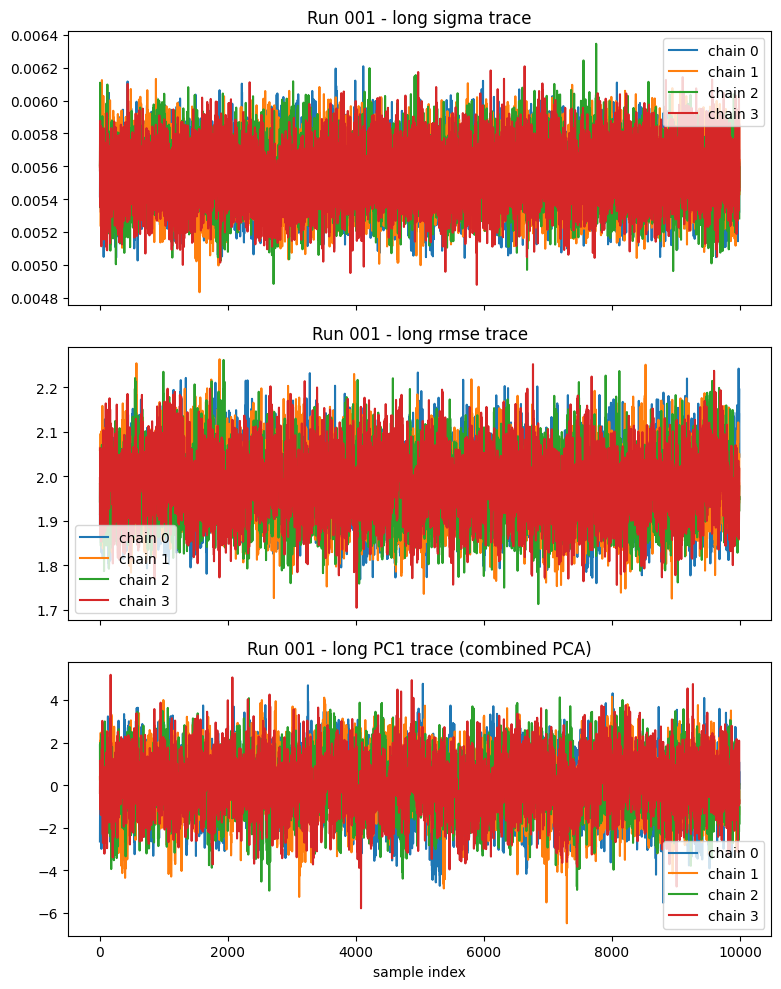

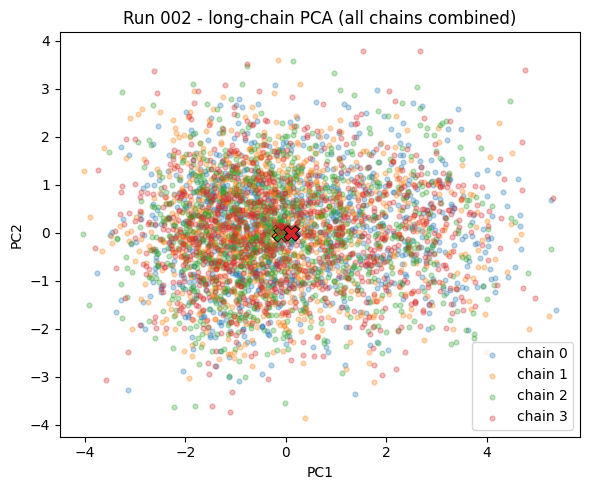

Run 002 centroids (PC1, PC2):
  chain 0: (0.1272, 0.0191)
  chain 1: (-0.1410, 0.0162)
  chain 2: (-0.0976, -0.0210)
  chain 3: (0.1114, -0.0144)


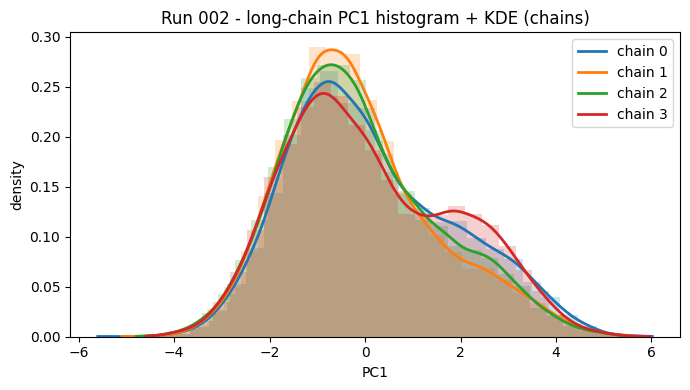

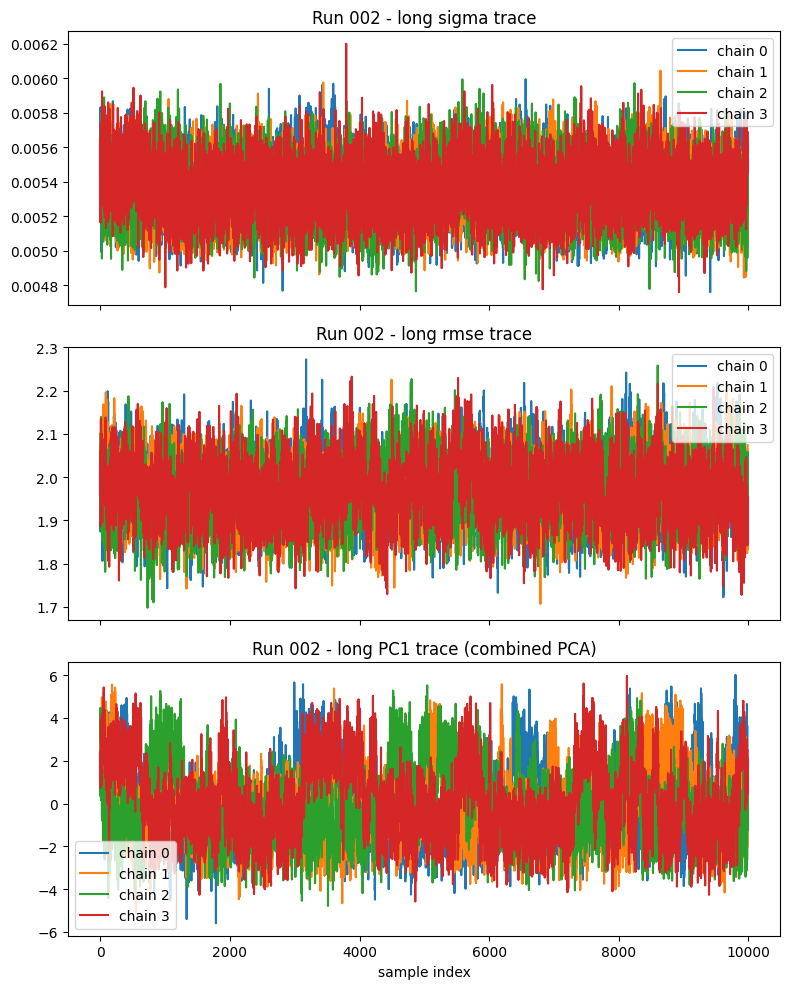

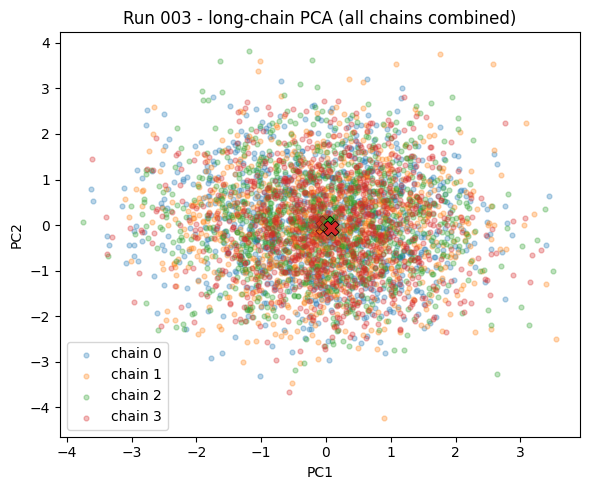

Run 003 centroids (PC1, PC2):
  chain 0: (-0.0252, 0.0414)
  chain 1: (-0.0448, -0.0406)
  chain 2: (-0.0004, 0.0547)
  chain 3: (0.0705, -0.0555)


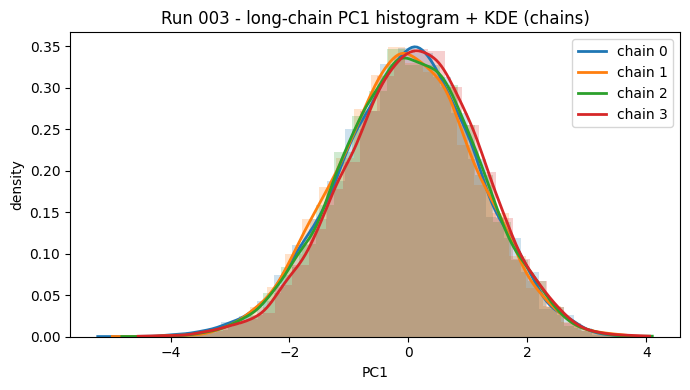

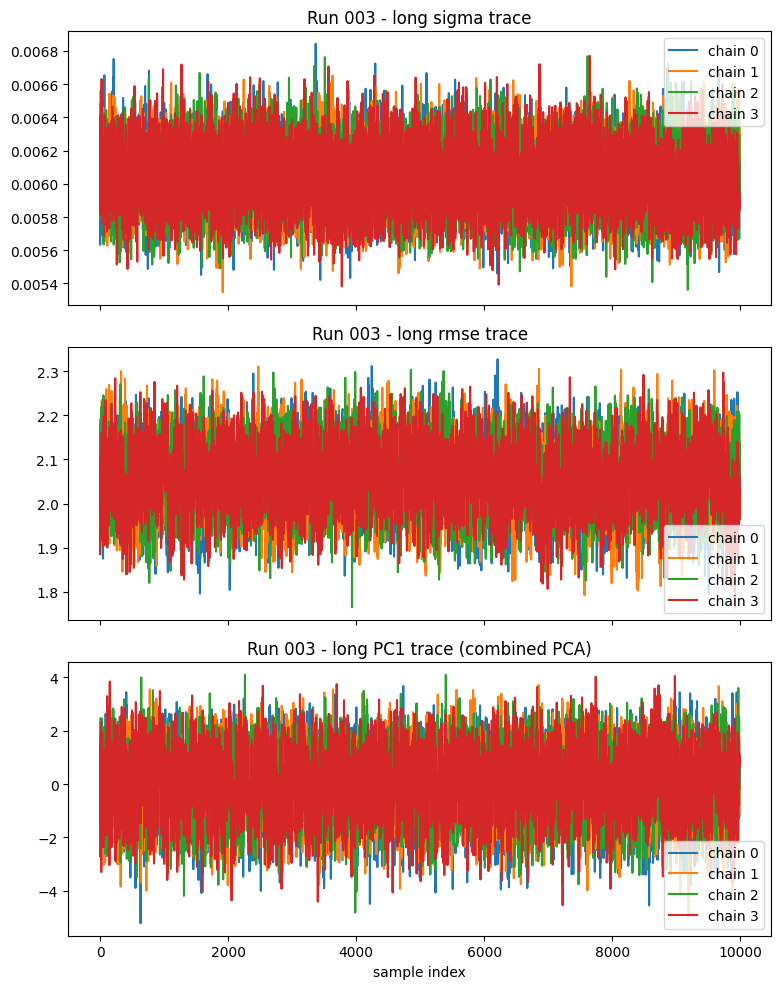

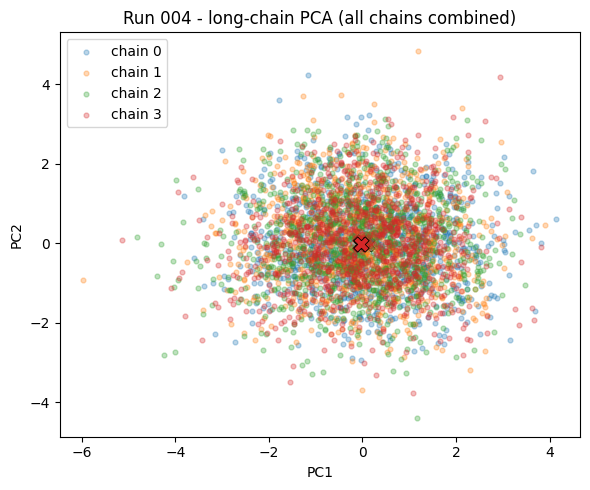

Run 004 centroids (PC1, PC2):
  chain 0: (0.1060, -0.0249)
  chain 1: (-0.0170, 0.0379)
  chain 2: (-0.0522, -0.0079)
  chain 3: (-0.0369, -0.0052)


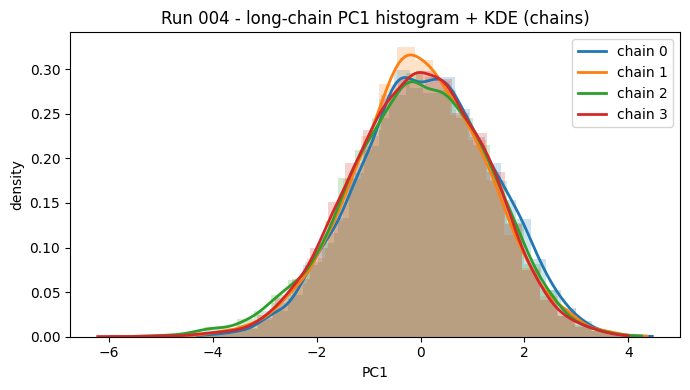

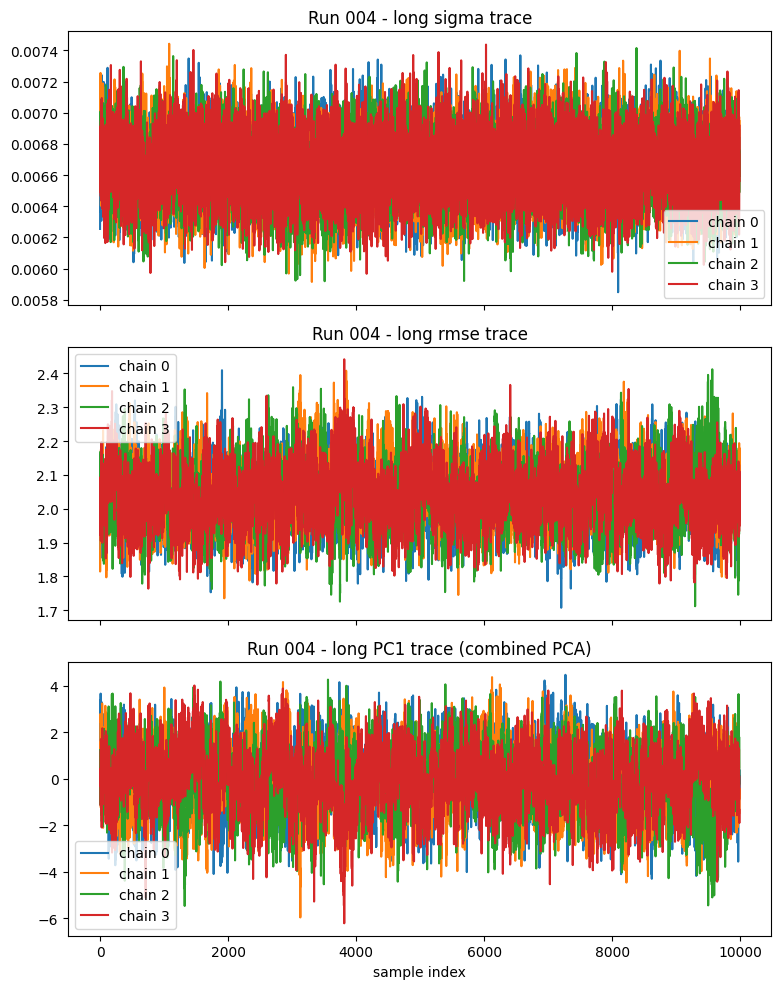

In [3]:
import ast
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde
from sklearn.decomposition import PCA

DATA_TAG = notebook
LONG_METHOD = "default_long"
RUN_IDS = LONG_RUN_IDS
LONG_BURN_IN = 10

DOWNSAMPLE_PER_CHAIN = 1000  # number of points per chain in PCA scatter
SCATTER_ALPHA = 0.3
CHAIN_COLORS = ["#1f77b4", "#ff7f0e", "#2ca02c", "#d62728"]  # high-contrast

def _load_with_shape(csv_path: Path):
    with open(csv_path, "r", encoding="utf-8") as f:
        header = f.readline().strip()
    if "original_shape=" not in header:
        raise ValueError(f"Missing original_shape in header: {csv_path}")
    shape_str = header.split("original_shape=")[-1]
    shape = ast.literal_eval(shape_str)
    data = np.loadtxt(csv_path, delimiter=",", comments="#")
    return data, shape

def _load_long_array(run_id: int, metric: str):
    path = BASE_STORE / DATA_TAG / metric / f"{DATA_TAG}__run{run_id:03d}__{LONG_METHOD}__{metric}.csv"
    raw, shape = _load_with_shape(path)
    return raw.reshape(shape)

def _plot_pc1_hist_kde(pc1_groups, labels, colors, title):
    plt.figure(figsize=(7, 4))
    for data, label, color in zip(pc1_groups, labels, colors):
        data = np.asarray(data)
        plt.hist(
            data,
            bins=30,
            density=True,
            alpha=0.22,
            color=color,
            label="_nolegend_",
        )
        kde = gaussian_kde(data)
        xs = np.linspace(np.min(data), np.max(data), 200)
        plt.plot(xs, kde(xs), color=color, linewidth=2, label=label)
    plt.title(title)
    plt.xlabel("PC1")
    plt.ylabel("density")
    plt.legend()
    plt.tight_layout()
    plt.show()

for run_id in RUN_IDS:
    preds = _load_long_array(run_id, "preds")
    sigmas = _load_long_array(run_id, "sigmas")
    rmses = _load_long_array(run_id, "rmses")
    if LONG_BURN_IN > 0:
        sigmas = sigmas[:, LONG_BURN_IN:]
        rmses = rmses[:, LONG_BURN_IN:]
        preds = preds[:, :, LONG_BURN_IN:]

    n_chains = preds.shape[0]
    n_samples = preds.shape[2]
    colors = [CHAIN_COLORS[i % len(CHAIN_COLORS)] for i in range(n_chains)]

    # Fit PCA once per run using all chains together (all samples as rows).
    sample_vectors = preds.transpose(0, 2, 1).reshape(n_chains * n_samples, -1)
    pca = PCA(n_components=2, random_state=0)
    sample_coords = pca.fit_transform(sample_vectors)
    pc1 = sample_coords[:, 0].reshape(n_chains, n_samples)
    pc2 = sample_coords[:, 1].reshape(n_chains, n_samples)

    plt.figure(figsize=(6, 5))
    for c in range(n_chains):
        if DOWNSAMPLE_PER_CHAIN is not None and DOWNSAMPLE_PER_CHAIN < n_samples:
            idx = np.linspace(0, n_samples - 1, DOWNSAMPLE_PER_CHAIN, dtype=int)
        else:
            idx = np.arange(n_samples)
        plt.scatter(
            pc1[c][idx],
            pc2[c][idx],
            color=colors[c],
            s=12,
            alpha=SCATTER_ALPHA,
            label=f"chain {c}",
        )
        centroid_x = np.mean(pc1[c])
        centroid_y = np.mean(pc2[c])
        plt.scatter(
            centroid_x,
            centroid_y,
            color=colors[c],
            s=120,
            marker="X",
            edgecolor="black",
            linewidth=0.6,
        )
    plt.title(f"Run {run_id:03d} - long-chain PCA (all chains combined)")
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.legend()
    plt.tight_layout()
    plt.show()

    print(f"Run {run_id:03d} centroids (PC1, PC2):")
    for c in range(n_chains):
        centroid_x = float(np.mean(pc1[c]))
        centroid_y = float(np.mean(pc2[c]))
        print(f"  chain {c}: ({centroid_x:.4f}, {centroid_y:.4f})")

    _plot_pc1_hist_kde(
        pc1_groups=[pc1[c] for c in range(n_chains)],
        labels=[f"chain {c}" for c in range(n_chains)],
        colors=colors,
        title=f"Run {run_id:03d} - long-chain PC1 histogram + KDE (chains)",
    )

    # Trace plots: sigmas, rmses, pc1 (PC1 from the combined PCA above)
    fig, axes = plt.subplots(3, 1, figsize=(8, 10), sharex=True)
    for c in range(n_chains):
        axes[0].plot(sigmas[c], color=colors[c], label=f"chain {c}")
        axes[1].plot(rmses[c], color=colors[c], label=f"chain {c}")
        axes[2].plot(pc1[c], color=colors[c], label=f"chain {c}")
    axes[0].set_title(f"Run {run_id:03d} - long sigma trace")
    axes[1].set_title(f"Run {run_id:03d} - long rmse trace")
    axes[2].set_title(f"Run {run_id:03d} - long PC1 trace (combined PCA)")
    axes[2].set_xlabel("sample index")
    for ax in axes:
        ax.legend()
    plt.tight_layout()
    plt.show()

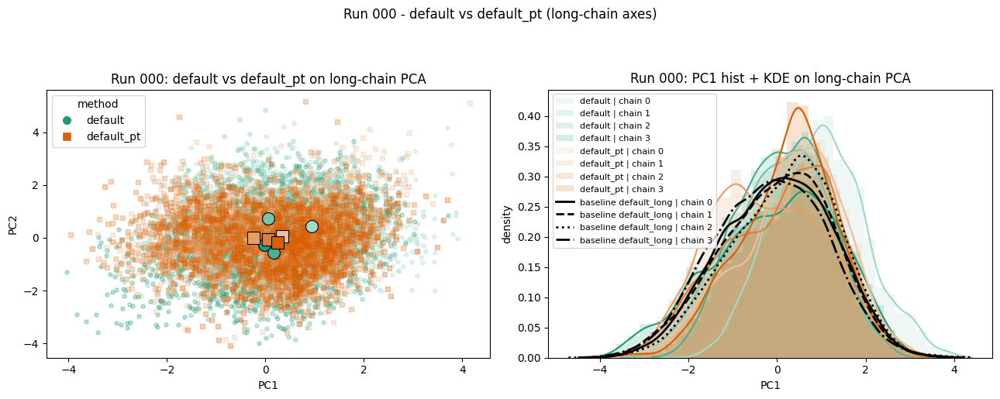

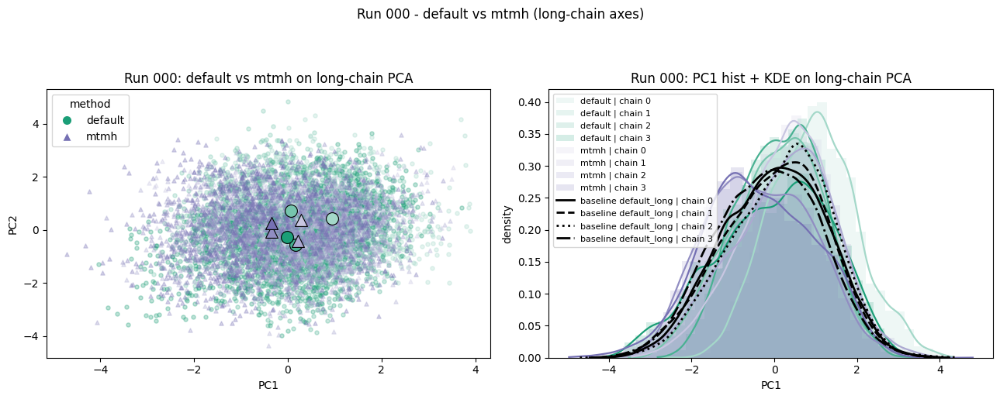

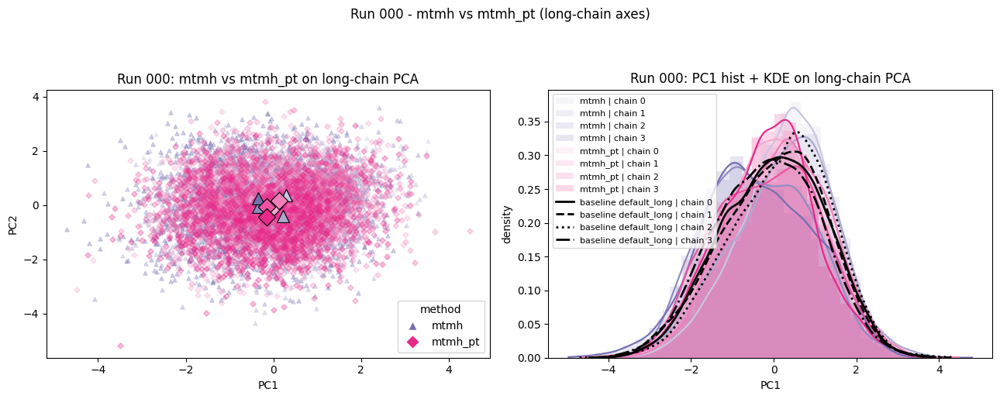

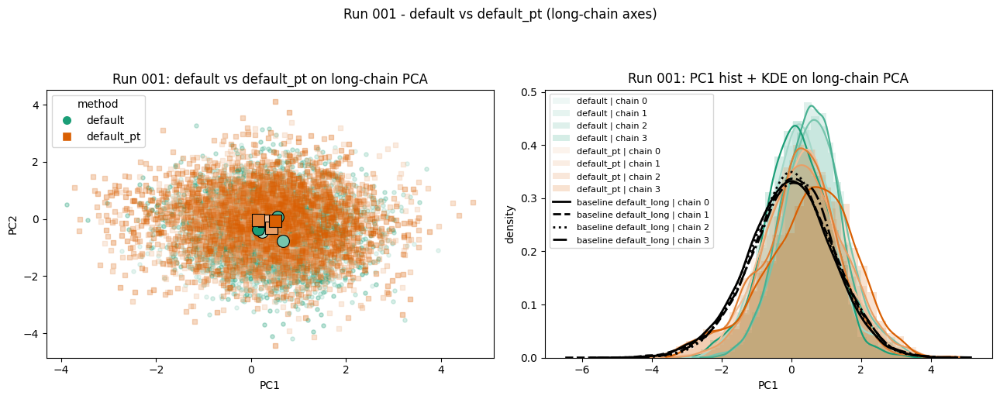

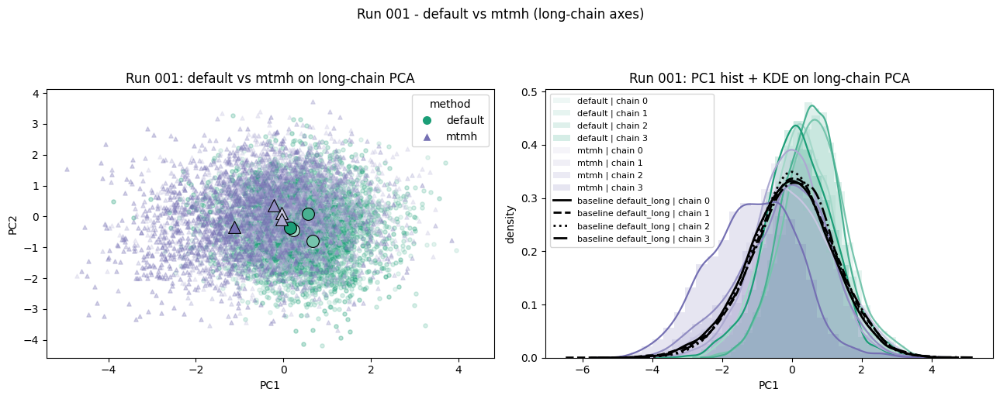

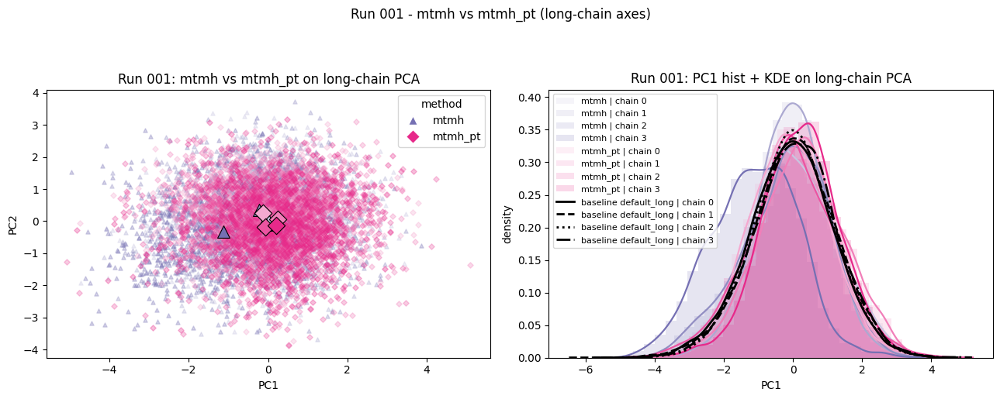

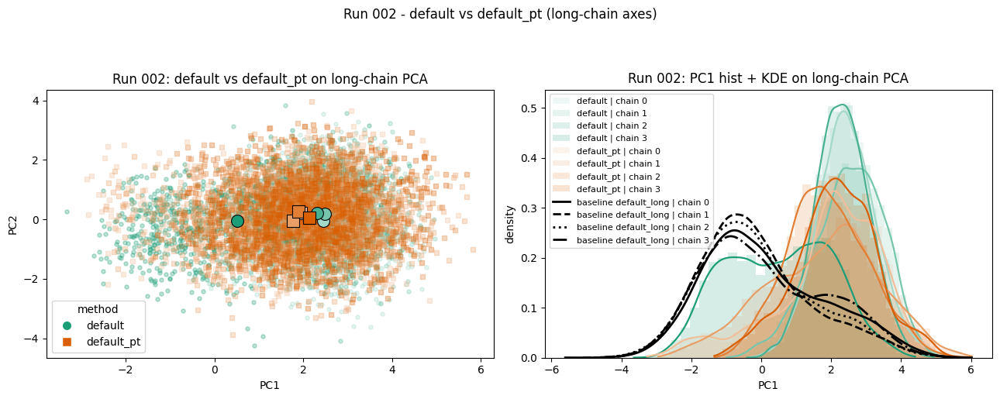

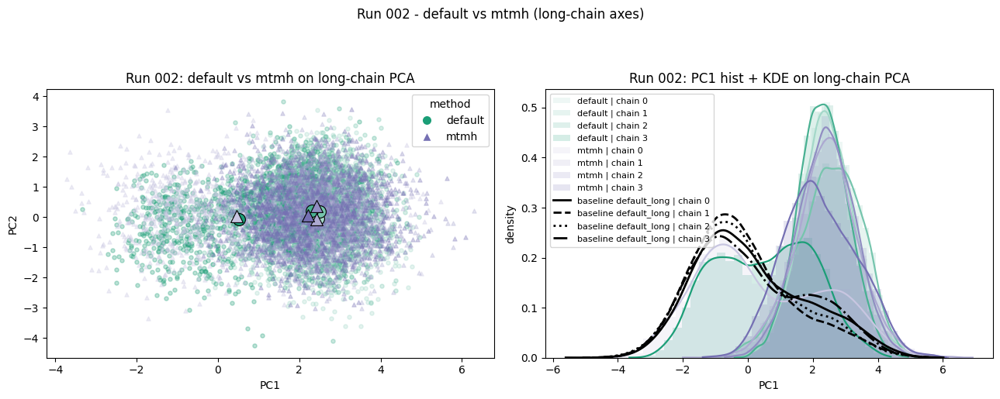

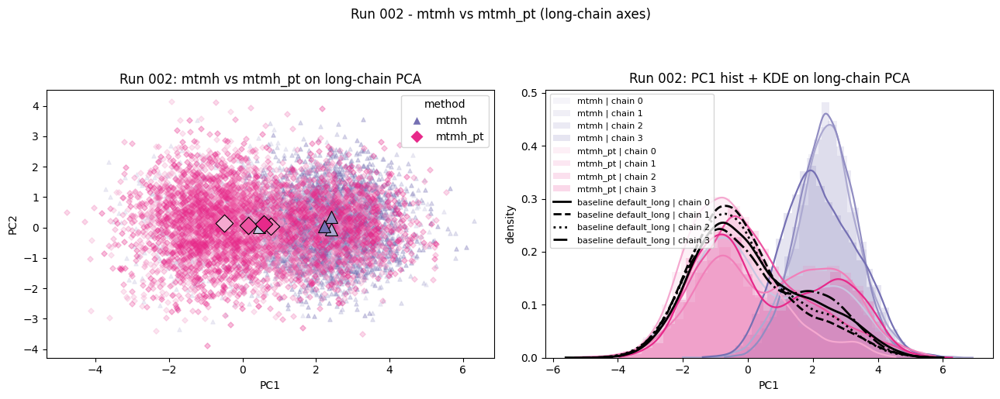

In [4]:
import ast
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde
from sklearn.decomposition import PCA
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D

BASE_STORE = ANALYSIS_STORE.parent
DATA_TAG = notebook

RUN_IDS = PAIRED_RUN_IDS
PAIRWISE_COMPARISONS = [
    ("default", "default_pt"),
    ("default", "mtmh"),
    ("mtmh", "mtmh_pt"),
]

BASELINE_METHOD = "default_long"
SHORT_BURN_IN = 500

DOWNSAMPLE_PER_CHAIN = 1000
SCATTER_ALPHA = 0.30
METHOD_MARKERS = {
    "default": "o",
    "default_pt": "s",
    "mtmh": "^",
    "mtmh_pt": "D",
}
METHOD_COLORS = {
    "default": "#1b9e77",
    "default_pt": "#d95f02",
    "mtmh": "#7570b3",
    "mtmh_pt": "#e7298a",
}

def _load_with_shape(csv_path: Path):
    with open(csv_path, "r", encoding="utf-8") as f:
        header = f.readline().strip()
    if "original_shape=" not in header:
        raise ValueError(f"Missing original_shape in header: {csv_path}")
    shape_str = header.split("original_shape=")[-1]
    shape = ast.literal_eval(shape_str)
    data = np.loadtxt(csv_path, delimiter=",", comments="#")
    return data, shape

def _load_long_pred(run_id: int, method: str):
    preds_path = BASE_STORE / DATA_TAG / "preds" / f"{DATA_TAG}__run{run_id:03d}__{method}__preds.csv"
    preds_raw, preds_shape = _load_with_shape(preds_path)
    return preds_raw.reshape(preds_shape)

def _load_short_chains(run_id: int, method: str):
    preds_path = BASE_STORE / DATA_TAG / "preds" / f"{DATA_TAG}__run{run_id:03d}__{method}__preds.csv"
    preds_raw, preds_shape = _load_with_shape(preds_path)
    preds = preds_raw.reshape(preds_shape)
    chains = []
    for chain_id in range(preds.shape[0]):
        chain_preds = preds[chain_id]
        if SHORT_BURN_IN > 0:
            chain_preds = chain_preds[:, SHORT_BURN_IN:]
        chains.append(chain_preds)
    return chains

def _fit_long_chain_pca(run_id: int):
    base_preds = _load_long_pred(run_id, BASELINE_METHOD)
    base_vectors = base_preds.transpose(0, 2, 1).reshape(
        base_preds.shape[0] * base_preds.shape[2], -1
    )
    pca = PCA(n_components=2, random_state=0)
    pca.fit(base_vectors)

    # Keep all long chains separate on the same long-defined PCA basis.
    baseline_pc1_by_chain = [
        pca.transform(base_preds[chain_id].T)[:, 0]
        for chain_id in range(base_preds.shape[0])
    ]
    return pca, baseline_pc1_by_chain

def _method_chain_shades(base_hex, n):
    base = np.array(mcolors.to_rgb(base_hex))
    if n == 1:
        return [tuple(base)]
    shades = []
    for i in range(n):
        t = 0.4 + 0.6 * (i / max(1, n - 1))
        rgb = tuple(base * t + (1 - t) * np.array([1.0, 1.0, 1.0]))
        shades.append(rgb)
    return shades

def _plot_pc1_hist_kde(
    ax,
    items,
    title,
    baseline_pc1_by_chain=None,
    baseline_label=None,
):
    for label, color, data in items:
        data = np.asarray(data)
        ax.hist(data, bins=30, density=True, alpha=0.18, color=color, label=label)
        try:
            kde = gaussian_kde(data)
            xs = np.linspace(np.min(data), np.max(data), 200)
            ax.plot(xs, kde(xs), color=color, linewidth=1.6)
        except Exception:
            pass

    # Four separate black KDE curves for the long-chain reference.
    # No pooled/mean long-chain KDE.
    if baseline_pc1_by_chain is not None:
        long_linestyles = ["-", "--", ":", "-."]
        for chain_id, baseline_pc1 in enumerate(baseline_pc1_by_chain):
            baseline_pc1 = np.asarray(baseline_pc1)
            try:
                kde = gaussian_kde(baseline_pc1)
                xs = np.linspace(np.min(baseline_pc1), np.max(baseline_pc1), 200)
                ax.plot(
                    xs,
                    kde(xs),
                    color="black",
                    linewidth=2.0,
                    linestyle=long_linestyles[chain_id % len(long_linestyles)],
                    label=f"{baseline_label or 'baseline'} | chain {chain_id}",
                )
            except Exception:
                pass

    ax.set_title(title)
    ax.set_xlabel("PC1")
    ax.set_ylabel("density")
    ax.legend(fontsize=8)

def _scatter_method_chains(ax, pca, method_chains, method_name):
    marker = METHOD_MARKERS.get(method_name, "o")
    base_color = METHOD_COLORS.get(method_name, "#333333")
    n_chains = len(method_chains)
    shades = _method_chain_shades(base_color, n_chains)
    for chain_id, chain_preds in enumerate(method_chains):
        chain_color = shades[chain_id % len(shades)]
        coords = pca.transform(chain_preds.T)
        if DOWNSAMPLE_PER_CHAIN is not None and DOWNSAMPLE_PER_CHAIN < coords.shape[0]:
            idx = np.linspace(0, coords.shape[0] - 1, DOWNSAMPLE_PER_CHAIN, dtype=int)
        else:
            idx = np.arange(coords.shape[0])
        ax.scatter(coords[idx, 0], coords[idx, 1], marker=marker, s=14, alpha=SCATTER_ALPHA, color=chain_color, label="_nolegend_")
        centroid = np.mean(coords, axis=0)
        ax.scatter(
            centroid[0],
            centroid[1],
            marker=marker,
            s=130,
            color=chain_color,
            edgecolor="black",
            linewidth=0.8,
            label=f"{method_name} | chain {chain_id}",
            zorder=5,
        )

for run_id in RUN_IDS:
    long_pca, baseline_pc1_by_chain = _fit_long_chain_pca(run_id)

    for method_a, method_b in PAIRWISE_COMPARISONS:
        fig, axes = plt.subplots(1, 2, figsize=(13, 5))

        method_a_chains = _load_short_chains(run_id, method_a)
        method_b_chains = _load_short_chains(run_id, method_b)
        method_groups = {method_a: method_a_chains, method_b: method_b_chains}

        for method_name, method_chains in method_groups.items():
            _scatter_method_chains(axes[0], long_pca, method_chains, method_name)

        axes[0].set_title(f"Run {run_id:03d}: {method_a} vs {method_b} on long-chain PCA")
        axes[0].set_xlabel("PC1")
        axes[0].set_ylabel("PC2")
        legend_handles = [
            Line2D(
                [0],
                [0],
                marker=METHOD_MARKERS[m],
                color="w",
                markerfacecolor=METHOD_COLORS[m],
                markersize=9,
                label=m,
            )
            for m in method_groups.keys()
        ]
        axes[0].legend(handles=legend_handles, title="method")

        items = []
        for method_name, method_chains in method_groups.items():
            base_color = METHOD_COLORS.get(method_name, "#333333")
            shades = _method_chain_shades(base_color, len(method_chains))
            for cidx, chain_preds in enumerate(method_chains):
                pc1 = long_pca.transform(chain_preds.T)[:, 0]
                items.append((f"{method_name} | chain {cidx}", shades[cidx % len(shades)], pc1))

        _plot_pc1_hist_kde(
            axes[1],
            items,
            title=f"Run {run_id:03d}: PC1 hist + KDE on long-chain PCA",
            baseline_pc1_by_chain=baseline_pc1_by_chain,
            baseline_label=f"baseline {BASELINE_METHOD}",
        )

        fig.suptitle(f"Run {run_id:03d} - {method_a} vs {method_b} (long-chain axes)", y=1.02)
        fig.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()


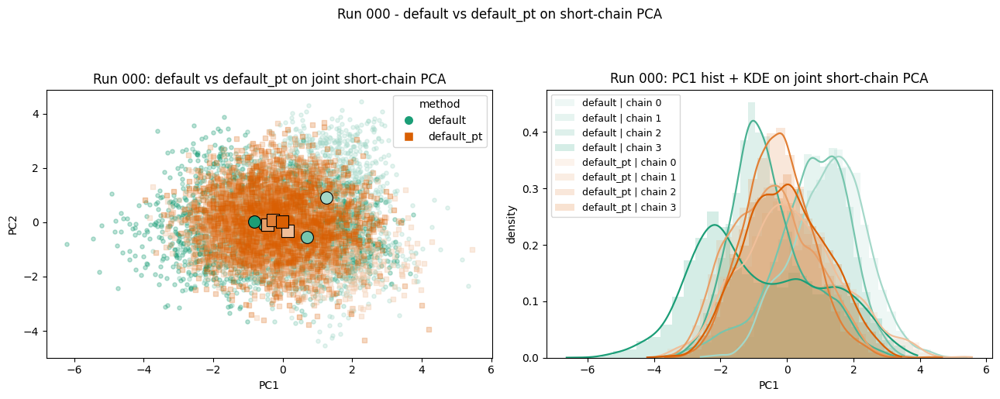

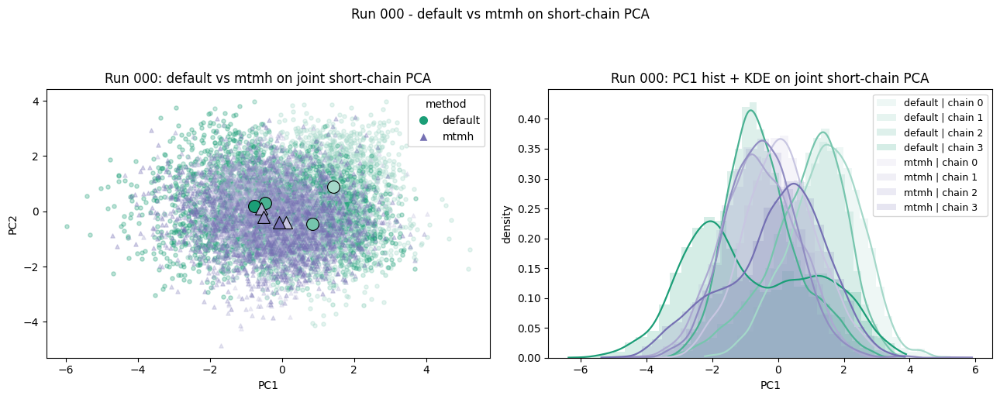

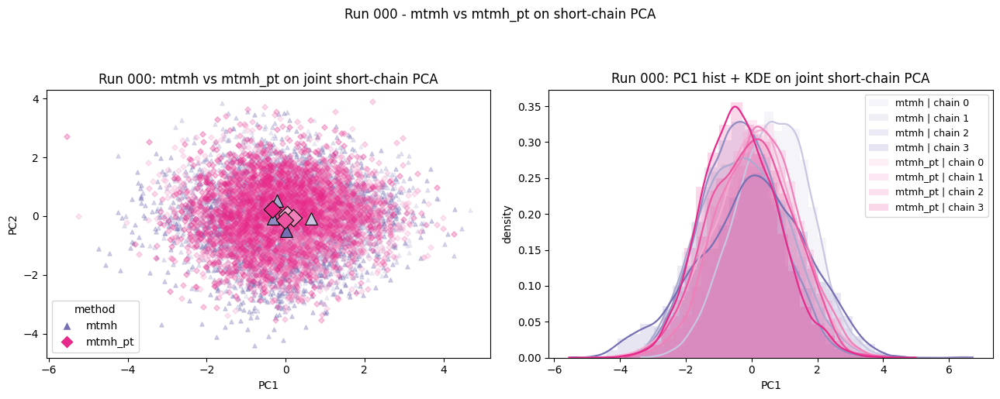

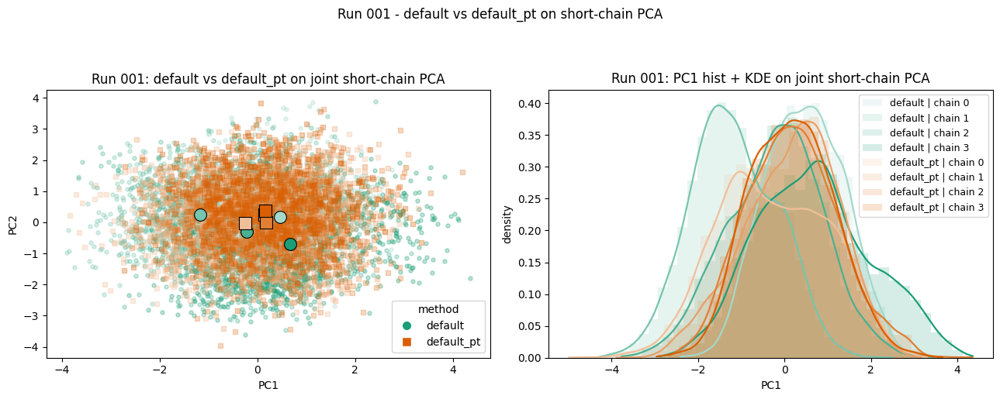

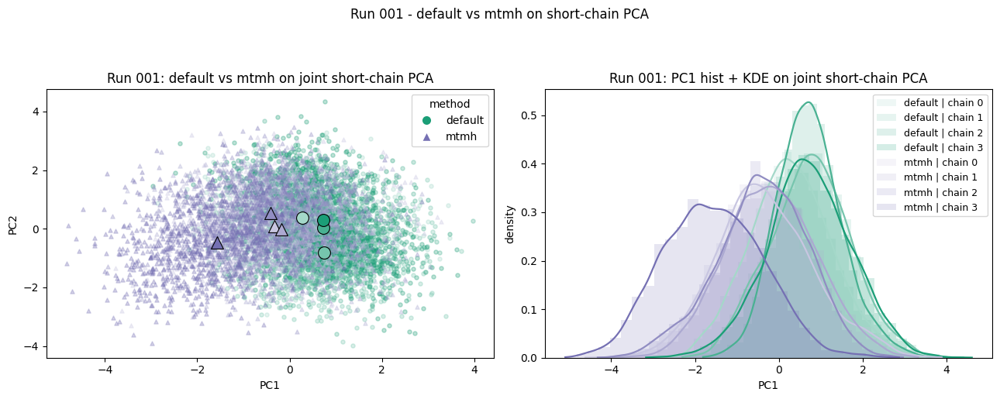

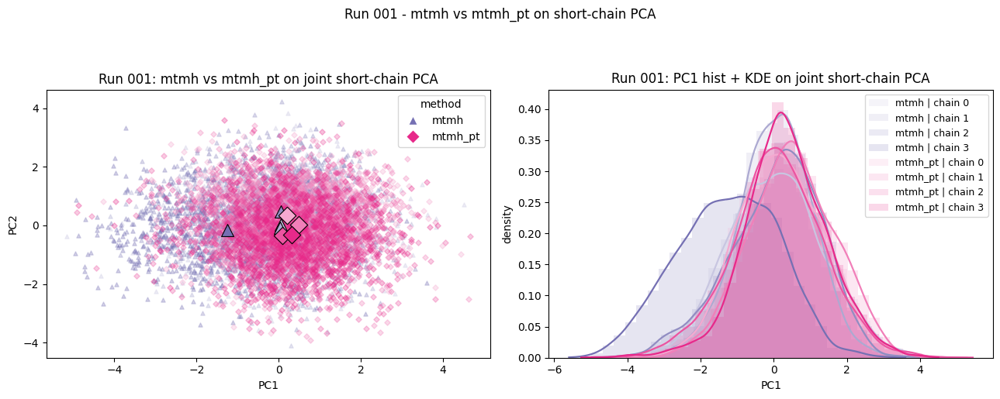

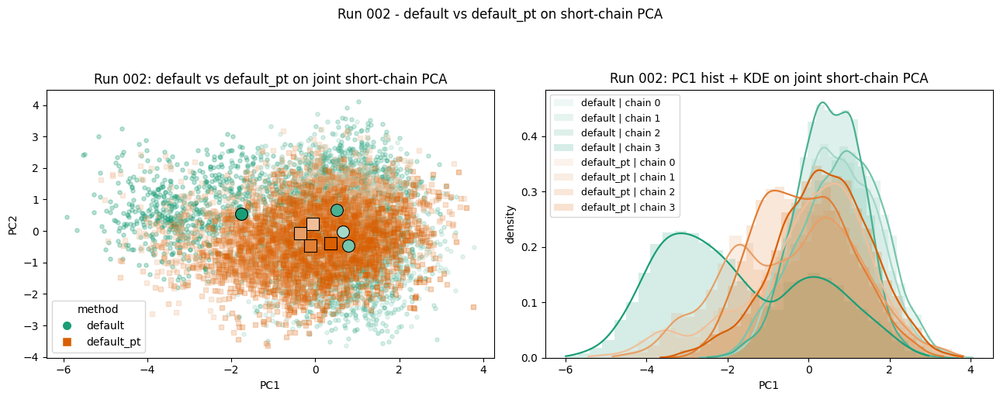

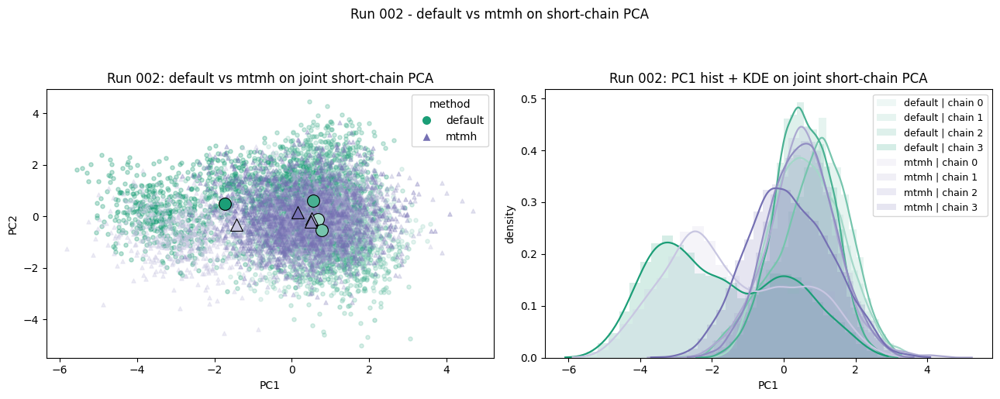

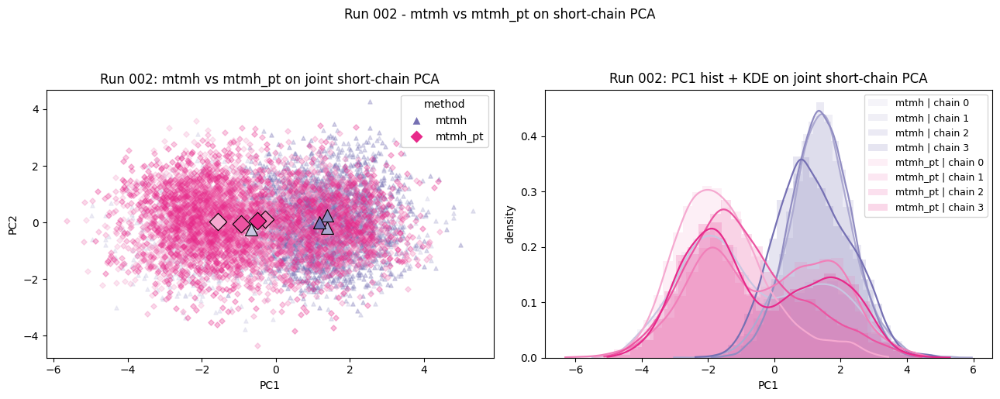

In [5]:
import ast
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde
from sklearn.decomposition import PCA
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D

BASE_STORE = ANALYSIS_STORE.parent
DATA_TAG = notebook

RUN_IDS = SHORT_RUN_IDS
PAIRWISE_COMPARISONS = [
    ("default", "default_pt"),
    ("default", "mtmh"),
    ("mtmh", "mtmh_pt"),
]

BURN_IN = 500
DOWNSAMPLE_PER_CHAIN = 1000
SCATTER_ALPHA = 0.30
METHOD_MARKERS = {
    "default": "o",
    "default_pt": "s",
    "mtmh": "^",
    "mtmh_pt": "D",
}
METHOD_COLORS = {
    "default": "#1b9e77",
    "default_pt": "#d95f02",
    "mtmh": "#7570b3",
    "mtmh_pt": "#e7298a",
}

def _load_with_shape(csv_path: Path):
    with open(csv_path, "r", encoding="utf-8") as f:
        header = f.readline().strip()
    if "original_shape=" not in header:
        raise ValueError(f"Missing original_shape in header: {csv_path}")
    shape_str = header.split("original_shape=")[-1]
    shape = ast.literal_eval(shape_str)
    data = np.loadtxt(csv_path, delimiter=",", comments="#")
    return data, shape

def _load_pred_chains(run_id: int, method: str):
    preds_path = BASE_STORE / DATA_TAG / "preds" / f"{DATA_TAG}__run{run_id:03d}__{method}__preds.csv"
    preds_raw, preds_shape = _load_with_shape(preds_path)
    preds = preds_raw.reshape(preds_shape)
    chains = []
    for chain_id in range(preds.shape[0]):
        chain_preds = preds[chain_id]
        if BURN_IN > 0:
            chain_preds = chain_preds[:, BURN_IN:]
        chains.append(chain_preds)
    return preds, chains

def _fit_joint_short_pca(run_id: int, method_a: str, method_b: str):
    _, method_a_chains = _load_pred_chains(run_id, method_a)
    _, method_b_chains = _load_pred_chains(run_id, method_b)
    joint_blocks = [chain_preds.T for chain_preds in method_a_chains + method_b_chains]
    joint_predictions = np.vstack(joint_blocks)
    pca = PCA(n_components=2, random_state=0)
    pca.fit(joint_predictions)
    return pca, {method_a: method_a_chains, method_b: method_b_chains}

def _method_chain_shades(base_hex, n):
    base = np.array(mcolors.to_rgb(base_hex))
    if n == 1:
        return [tuple(base)]
    shades = []
    for i in range(n):
        t = 0.4 + 0.6 * (i / max(1, n - 1))
        rgb = tuple(base * t + (1 - t) * np.array([1.0, 1.0, 1.0]))
        shades.append(rgb)
    return shades

def _plot_pc1_hist_kde(ax, items, title):
    for label, color, data in items:
        data = np.asarray(data)
        ax.hist(data, bins=30, density=True, alpha=0.18, color=color, label=label)
        try:
            kde = gaussian_kde(data)
            xs = np.linspace(np.min(data), np.max(data), 200)
            ax.plot(xs, kde(xs), color=color, linewidth=1.6)
        except Exception:
            pass

    ax.set_title(title)
    ax.set_xlabel("PC1")
    ax.set_ylabel("density")
    ax.legend(fontsize=9)

def _scatter_method_chains(ax, pca, method_chains, method_name, title):
    marker = METHOD_MARKERS.get(method_name, "o")
    base_color = METHOD_COLORS.get(method_name, "#333333")
    n_chains = len(method_chains)
    shades = _method_chain_shades(base_color, n_chains)
    for chain_id, chain_preds in enumerate(method_chains):
        chain_color = shades[chain_id % len(shades)]
        coords = pca.transform(chain_preds.T)
        if DOWNSAMPLE_PER_CHAIN is not None and DOWNSAMPLE_PER_CHAIN < coords.shape[0]:
            idx = np.linspace(0, coords.shape[0] - 1, DOWNSAMPLE_PER_CHAIN, dtype=int)
        else:
            idx = np.arange(coords.shape[0])
        ax.scatter(coords[idx, 0], coords[idx, 1], marker=marker, s=14, alpha=SCATTER_ALPHA, color=chain_color, label="_nolegend_")
        centroid = np.mean(coords, axis=0)
        ax.scatter(
            centroid[0],
            centroid[1],
            marker=marker,
            s=130,
            color=chain_color,
            edgecolor="black",
            linewidth=0.8,
            label=f"{method_name} | chain {chain_id}",
            zorder=5,
        )

    ax.set_title(title)
    ax.set_xlabel("PC1")
    ax.set_ylabel("PC2")

for run_id in RUN_IDS:
    for method_a, method_b in PAIRWISE_COMPARISONS:
        joint_pca, method_groups = _fit_joint_short_pca(run_id, method_a, method_b)

        fig, axes = plt.subplots(1, 2, figsize=(13, 5))

        for method_name, method_chains in method_groups.items():
            _scatter_method_chains(
                axes[0],
                joint_pca,
                method_chains,
                method_name,
                title=f"Run {run_id:03d}: {method_a} vs {method_b} on joint short-chain PCA",
            )

        legend_handles = [
            Line2D([0], [0], marker=METHOD_MARKERS[m], color="w", markerfacecolor=METHOD_COLORS[m], markersize=9, label=m)
            for m in method_groups.keys()
        ]
        axes[0].legend(handles=legend_handles, title="method")

        items = []
        for method_name, method_chains in method_groups.items():
            base_color = METHOD_COLORS.get(method_name, "#333333")
            shades = _method_chain_shades(base_color, len(method_chains))
            for cidx, chain_preds in enumerate(method_chains):
                pc1 = joint_pca.transform(chain_preds.T)[:, 0]
                items.append((f"{method_name} | chain {cidx}", shades[cidx % len(shades)], pc1))

        _plot_pc1_hist_kde(
            axes[1],
            items,
            title=f"Run {run_id:03d}: PC1 hist + KDE on joint short-chain PCA",
        )

        fig.suptitle(f"Run {run_id:03d} - {method_a} vs {method_b} on short-chain PCA", y=1.02)
        fig.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()


In [6]:
import ast
from pathlib import Path

import numpy as np
import pandas as pd
from IPython.display import display

BASE_STORE = ANALYSIS_STORE.parent
DATA_TAG = notebook

LONG_METHOD = "default_long"
SHORT_METHODS = ["default", "default_pt", "mtmh", "mtmh_pt"]
SHORT_METHOD_NAMES = {
    "default": "Default",
    "default_pt": "Default PT",
    "mtmh": "MTMH",
    "mtmh_pt": "MTMH + PT",
}

LONG_BURN_IN = 10
SHORT_BURN_IN = 500

METHOD_LABELS = {
    "long_default": "Default long",
    "default": "Default (10k)",
    "default_pt": "Default PT (10k)",
    "mtmh": "MTMH (10k)",
    "mtmh_pt": "MTMH + PT (10k)",
}


def _load_with_shape(csv_path: Path):
    with open(csv_path, "r", encoding="utf-8") as f:
        header = f.readline().strip()
    if "original_shape=" not in header:
        raise ValueError(f"Missing original_shape in header: {csv_path}")
    shape_str = header.split("original_shape=")[-1]
    shape = ast.literal_eval(shape_str)
    data = np.loadtxt(csv_path, delimiter=",", comments="#")
    return data, shape


def _crps_from_samples(samples, y_true):
    samples = np.asarray(samples)
    y_true = np.asarray(y_true)
    n_points, n_samples = samples.shape
    term1 = np.mean(np.abs(samples - y_true[:, None]), axis=1)
    samples_sorted = np.sort(samples, axis=1)
    k = np.arange(1, n_samples + 1)
    coeffs = (2 * k - n_samples - 1)[None, :]
    term2 = np.sum(coeffs * samples_sorted, axis=1) / (n_samples**2)
    return term1 - term2


def _load_prediction_chains(base_store: Path, tag: str, run_id: int, method: str, burn_in: int):
    preds_path = base_store / tag / "preds" / f"{tag}__run{run_id:03d}__{method}__preds.csv"
    preds_raw, preds_shape = _load_with_shape(preds_path)
    preds = preds_raw.reshape(preds_shape)
    chains = []
    for chain_id in range(preds.shape[0]):
        chain_preds = preds[chain_id]
        if burn_in > 0:
            chain_preds = chain_preds[:, burn_in:]
        chains.append(chain_preds)
    return preds, chains


def _load_subsample_y(base_store: Path, tag: str, run_id: int):
    y_path = base_store / tag / "subsample_y_test" / f"{tag}__run{run_id:03d}__subsample_y_test.csv"
    y_raw, y_shape = _load_with_shape(y_path)
    return np.asarray(y_raw.reshape(y_shape)).reshape(-1)


def _available_run_ids(base_store: Path, tag: str, method: str):
    preds_dir = base_store / tag / "preds"
    run_ids = []
    for path in preds_dir.glob(f"{tag}__run*__{method}__preds.csv"):
        parts = path.name.split("__run")
        if len(parts) < 2:
            continue
        run_fragment = parts[1].split("__", 1)[0]
        try:
            run_ids.append(int(run_fragment))
        except ValueError:
            continue
    return sorted(set(run_ids))


def _chain_metric_row(chain_preds, y_true):
    y_pred = np.mean(chain_preds, axis=1)
    rmse = float(np.sqrt(np.mean((y_pred - y_true) ** 2)))
    crps = float(np.mean(_crps_from_samples(chain_preds, y_true)))
    return rmse, crps


def _grouped_view(metric_df):
    long_col = METHOD_LABELS["long_default"]
    groups = {
        ("Long baseline", "Default long"): metric_df[long_col],
    }
    for method in SHORT_METHODS:
        short_label = SHORT_METHOD_NAMES[method]
        groups[("Short chain", short_label)] = metric_df[METHOD_LABELS[method]]
    grouped_df = pd.DataFrame(groups, index=metric_df.index)
    grouped_df.columns = pd.MultiIndex.from_tuples(grouped_df.columns)
    return grouped_df


run_id_sets = [set(_available_run_ids(BASE_STORE, DATA_TAG, LONG_METHOD))]
for method in SHORT_METHODS:
    run_id_sets.append(set(_available_run_ids(BASE_STORE, DATA_TAG, method)))
run_ids = sorted(set.intersection(*run_id_sets)) if run_id_sets else []
if not run_ids:
    raise FileNotFoundError("No overlapping runs found for long-chain baseline and short-chain methods.")

rmse_rows = []
crps_rows = []

for run_id in run_ids:
    y_true = _load_subsample_y(BASE_STORE, DATA_TAG, run_id)

    rmse_row = {"run": f"Run {run_id:03d}"}
    crps_row = {"run": f"Run {run_id:03d}"}

    _, long_chains = _load_prediction_chains(
        BASE_STORE, DATA_TAG, run_id, LONG_METHOD, LONG_BURN_IN
    )
    long_rmse_vals = []
    long_crps_vals = []
    for chain_preds in long_chains:
        rmse_val, crps_val = _chain_metric_row(chain_preds, y_true)
        long_rmse_vals.append(rmse_val)
        long_crps_vals.append(crps_val)
    rmse_row[METHOD_LABELS["long_default"]] = float(np.mean(long_rmse_vals))
    crps_row[METHOD_LABELS["long_default"]] = float(np.mean(long_crps_vals))

    for method in SHORT_METHODS:
        _, short_chains = _load_prediction_chains(
            BASE_STORE, DATA_TAG, run_id, method, SHORT_BURN_IN
        )
        rmse_vals = []
        crps_vals = []
        for chain_preds in short_chains:
            rmse_val, crps_val = _chain_metric_row(chain_preds, y_true)
            rmse_vals.append(rmse_val)
            crps_vals.append(crps_val)
        label = METHOD_LABELS[method]
        rmse_row[label] = float(np.mean(rmse_vals))
        crps_row[label] = float(np.mean(crps_vals))

    rmse_rows.append(rmse_row)
    crps_rows.append(crps_row)

rmse_df = pd.DataFrame(rmse_rows).set_index("run")
crps_df = pd.DataFrame(crps_rows).set_index("run")

column_order = [METHOD_LABELS["long_default"]] + [METHOD_LABELS[m] for m in SHORT_METHODS]
rmse_df = rmse_df[column_order]
crps_df = crps_df[column_order]

rmse_grouped_df = _grouped_view(rmse_df)
crps_grouped_df = _grouped_view(crps_df)

print("RMSE (grouped view)")
display(rmse_grouped_df.round(4))
print("\nCRPS (grouped view)")
display(crps_grouped_df.round(4))

print("\nRMSE average across runs")
display(rmse_grouped_df.mean(axis=0).to_frame().T.rename(index={0: "Average"}).round(4))
print("\nCRPS average across runs")
display(crps_grouped_df.mean(axis=0).to_frame().T.rename(index={0: "Average"}).round(4))

RMSE (grouped view)


Long baseline Short chain                             
         Default long     Default Default PT    MTMH MTMH + PT
run                                                           
Run 000        1.9826      1.9958     1.9948  1.9794    1.9822
Run 001        1.8780      1.8934     1.8874  1.8929    1.8860
Run 002        1.8651      1.8771     1.8875  1.8820    1.8703


CRPS (grouped view)


Long baseline Short chain                             
         Default long     Default Default PT    MTMH MTMH + PT
run                                                           
Run 000        1.0573      1.0715     1.0669  1.0601    1.0590
Run 001        1.0114      1.0400     1.0264  1.0207    1.0189
Run 002        1.0014      1.0175     1.0138  1.0145    1.0055


RMSE average across runs


Long baseline Short chain                             
         Default long     Default Default PT    MTMH MTMH + PT
Average        1.9086      1.9221     1.9233  1.9181    1.9128


CRPS average across runs


Long baseline Short chain                             
         Default long     Default Default PT    MTMH MTMH + PT
Average        1.0234       1.043     1.0357  1.0318    1.0278

# Energy distance (chain-level)

We use chain-level pairwise comparisons: each short-chain method is compared with the long-chain baseline across all 4x4 chain pairs, then summarized as mean (std).

Energy Distance measures how different two sample distributions are; larger values indicate larger differences in location/shape.

For two sample sets $X = \{x_1,\dots,x_n\}$ and $Y = \{y_1,\dots,y_m\}$ (each $x_i, y_j \in \mathbb{R}^d$), the squared Energy Distance is defined as:

$$
\widehat{\mathcal{E}}^2(X,Y) = \frac{2}{nm}\sum_{i=1}^{n}\sum_{j=1}^{m} \|x_i - y_j\| - \frac{1}{n(n-1)}\sum_{i\neq i'}\|x_i - x_{i'}\| - \frac{1}{m(m-1)}\sum_{j\neq j'}\|y_j - y_{j'}\|
$$

where $\|\cdot\|$ denotes the Euclidean distance. The first term measures the average cross-sample distance, while the latter two terms measure within-sample dispersions. This estimator excludes self-pairs (diagonals) from the within-sample terms.


In [7]:
# -------- Energy distance (chain-level 4x4 pairwise -> mean(std)) --------
ED_MAX_DRAWS_PER_CHAIN = 2000  # per pair, keeps O(n^2) cost manageable
SHORT_METHOD_DISPLAY = {
    "default": "Default",
    "default_pt": "Default PT",
    "mtmh": "MTMH",
    "mtmh_pt": "MTMH + PT",
}

def _stack_draw_vectors(chain_list):
    return [np.asarray(chain).T for chain in chain_list]  # each: (n_samples, n_points)

def _euclidean_dists(a, b):
    a2 = np.sum(a * a, axis=1, keepdims=True)
    b2 = np.sum(b * b, axis=1, keepdims=True).T
    d2 = np.maximum(a2 + b2 - 2.0 * (a @ b.T), 0.0)
    return np.sqrt(d2)

def _energy_distance(x, y):
    if x.shape[0] < 2 or y.shape[0] < 2:
        return np.nan
    d_xy = _euclidean_dists(x, y).mean()
    d_xx = _euclidean_dists(x, x)
    d_yy = _euclidean_dists(y, y)
    within_x = (d_xx.sum() - np.trace(d_xx)) / (x.shape[0] * (x.shape[0] - 1))
    within_y = (d_yy.sum() - np.trace(d_yy)) / (y.shape[0] * (y.shape[0] - 1))
    return float(2.0 * d_xy - within_x - within_y)

run_id_sets = [set(_available_run_ids(BASE_STORE, DATA_TAG, LONG_METHOD))]
for method in SHORT_METHODS:
    run_id_sets.append(set(_available_run_ids(BASE_STORE, DATA_TAG, method)))
run_ids = sorted(set.intersection(*run_id_sets)) if run_id_sets else []
if not run_ids:
    raise FileNotFoundError("No overlapping runs found for long-chain baseline and short-chain methods.")

rows = []
rng = np.random.default_rng(2028)

for run_id in run_ids:
    _, long_chains = _load_prediction_chains(
        BASE_STORE, DATA_TAG, run_id, LONG_METHOD, LONG_BURN_IN
    )
    long_draws = _stack_draw_vectors(long_chains)

    for method in SHORT_METHODS:
        _, short_chains = _load_prediction_chains(
            BASE_STORE, DATA_TAG, run_id, method, SHORT_BURN_IN
        )
        short_draws = _stack_draw_vectors(short_chains)

        pair_vals = []
        for s_chain in short_draws:
            for l_chain in long_draws:
                n_use = min(s_chain.shape[0], l_chain.shape[0], ED_MAX_DRAWS_PER_CHAIN)
                if n_use < 2:
                    continue
                s_idx = rng.choice(s_chain.shape[0], size=n_use, replace=False)
                l_idx = rng.choice(l_chain.shape[0], size=n_use, replace=False)
                pair_vals.append(_energy_distance(s_chain[s_idx], l_chain[l_idx]))

        pair_vals = np.asarray(pair_vals, dtype=float)
        mean_val = float(np.nanmean(pair_vals)) if pair_vals.size else np.nan
        std_val = float(np.nanstd(pair_vals, ddof=1)) if pair_vals.size > 1 else 0.0
        rows.append(
            {
                "run": f"Run {run_id:03d}",
                "method": SHORT_METHOD_DISPLAY[method],
                "mean": mean_val,
                "std": std_val,
                "display": f"{mean_val:.6f} ({std_val:.6f})",
            }
        )

ed_chain_df = pd.DataFrame(rows)
print("Energy distance (chain-level): mean (std) over 4x4 chain pairs")
wide = ed_chain_df.pivot(index="run", columns="method", values="display")
wide = wide.reindex(columns=[SHORT_METHOD_DISPLAY[m] for m in SHORT_METHODS])
display(wide)

Energy distance (chain-level): mean (std) over 4x4 chain pairs


method,Default,Default PT,MTMH,MTMH + PT
run,,,,
Run 000,0.588959 (0.138919),0.251711 (0.053436),0.208478 (0.039789),0.121023 (0.032833)
Run 001,0.476144 (0.080014),0.157689 (0.033990),0.214551 (0.131130),0.083832 (0.016381)
Run 002,0.905274 (0.314090),0.556097 (0.109466),0.584511 (0.286883),0.093374 (0.033478)


# Original Prediction-Space Chain Separation

For each `(run, method)`, a draw is represented by its prediction vector across the 100 test points. Chain identity defines the clusters. The metrics below are calculated directly in this original prediction space.

`mean_centroid_distance` is the mean pairwise Euclidean distance between chain centroids in the original prediction space. `between_within_ratio` compares between-chain variation with within-chain variation; larger values indicate stronger chain separation.

In [10]:
RUN_IDS = SHORT_RUN_IDS
prediction_space_rows = []

for run_id in RUN_IDS:
    for method in SHORT_METHODS:
        X, y, _ = _build_chain_labeled_matrix(
            run_id=run_id,
            method=method,
            max_draws_per_chain=LDA_MAX_DRAWS_PER_CHAIN,
            seed=LDA_RANDOM_SEED + run_id,
        )
        metrics = _chain_separation_metrics(X, y)

        prediction_space_rows.append(
            {
                "run": f"Run {run_id:03d}",
                "method": _method_name(method),
                "n_samples": int(X.shape[0]),
                "n_features": int(X.shape[1]),
                "mean_centroid_distance": metrics["mean_centroid_distance"],
                "between_within_ratio": metrics["between_within_ratio"],
            }
        )

prediction_space_summary_df = pd.DataFrame(prediction_space_rows)
print("Original prediction-space chain-separation summary")
display(prediction_space_summary_df.round(4))

print("\nPivot: mean_centroid_distance")
display(
    prediction_space_summary_df.pivot_table(
        index="run",
        columns="method",
        values="mean_centroid_distance",
        aggfunc="mean",
    ).round(4)
)

print("\nPivot: between_within_ratio")
display(
    prediction_space_summary_df.pivot_table(
        index="run",
        columns="method",
        values="between_within_ratio",
        aggfunc="mean",
    ).round(4)
)

print("\nMean over runs by method")
display(
    prediction_space_summary_df.groupby("method", as_index=False)[
        ["mean_centroid_distance", "between_within_ratio"]
    ].mean().round(4)
)

Original prediction-space chain-separation summary


,run,method,n_samples,n_features,mean_centroid_distance,between_within_ratio
0,Run 000,Default,6000,100,2.7179,0.0746
1,Run 000,Default PT,6000,100,1.7284,0.0293
2,Run 000,MTMH,6000,100,1.8506,0.0336
3,Run 000,MTMH + PT,6000,100,1.2152,0.0143
4,Run 001,Default,6000,100,2.6363,0.0770
5,Run 001,Default PT,6000,100,1.4256,0.0199
6,Run 001,MTMH,6000,100,1.7738,0.0319
7,Run 001,MTMH + PT,6000,100,1.1517,0.0129
8,Run 002,Default,6000,100,2.8214,0.0823
9,Run 002,Default PT,6000,100,1.5081,0.0221



Pivot: mean_centroid_distance


method,Default,Default PT,MTMH,MTMH + PT
run,,,,
Run 000,2.7179,1.7284,1.8506,1.2152
Run 001,2.6363,1.4256,1.7738,1.1517
Run 002,2.8214,1.5081,1.9036,1.1785



Pivot: between_within_ratio


method,Default,Default PT,MTMH,MTMH + PT
run,,,,
Run 000,0.0746,0.0293,0.0336,0.0143
Run 001,0.0770,0.0199,0.0319,0.0129
Run 002,0.0823,0.0221,0.0384,0.0136



Mean over runs by method


,method,mean_centroid_distance,between_within_ratio
0,Default,2.7252,0.0779
1,Default PT,1.5540,0.0237
2,MTMH,1.8427,0.0346
3,MTMH + PT,1.1818,0.0136


# Rolling-Window Multivariate Gelman-Rubin R-hat

For every short-chain method and run, a window of 1000 consecutive iterations slides across the four chains in steps of 100, starting at iteration 0. Each iteration is a 100-dimensional vector of test-point predictions.

Within each window, we calculate the Brooks-Gelman multivariate potential scale reduction factor (MPSRF), which is a single R-hat value based on the largest generalized eigenvalue of the between-chain and within-chain covariance matrices. It detects the worst-mixing linear combination of the 100 prediction dimensions. The reference threshold is the median rolling-window MPSRF from the default-long runs using the same window size and step.

For a window containing $m$ chains, $n$ draws per chain, and $p=100$ prediction dimensions, let $x_{jt}$ be draw $t$ from chain $j$, $\bar{x}_j$ the mean of chain $j$, and $\bar{x}$ the mean across chain means. The average within-chain covariance matrix is

$$
W = \frac{1}{m} \sum_{j=1}^{m} \frac{1}{n-1} \sum_{t=1}^{n} (x_{jt}-\bar{x}_j)(x_{jt}-\bar{x}_j)^T,
$$

and the between-chain covariance matrix is

$$
B = \frac{n}{m-1} \sum_{j=1}^{m} (\bar{x}_j-\bar{x})(\bar{x}_j-\bar{x})^T.
$$

To stabilize the calculation, we use $W_{\mathrm{reg}} = W + \epsilon I$, where $\epsilon = 10^{-8}\,\mathrm{tr}(W)/p$. Let $\lambda_{\max}$ be the largest generalized eigenvalue of $(B/n, W_{\mathrm{reg}})$, equivalently the largest eigenvalue of $W_{\mathrm{reg}}^{-1}(B/n)$. The rolling-window MPSRF is

$$
\widehat{R}_{\mathrm{multi}} = \sqrt{\frac{n-1}{n} + \frac{m+1}{m}\lambda_{\max}}.
$$

Here $m=4$, $n=1000$, and the window advances by 100 iterations. The default-long median is used as the empirical reference threshold instead of the univariate rank-normalized $\widehat{R}=1.01$ threshold.

The accompanying pointwise rank-split R-hat plot summarizes the 100 test points with a mean ± standard-deviation band and a median with an interquartile-range band.


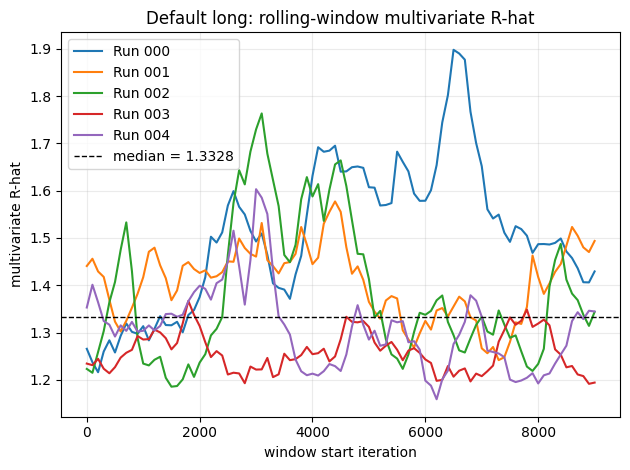

Default-long median rolling-window multivariate R-hat: 1.3328


In [11]:
import matplotlib.pyplot as plt

ROLLING_WINDOW = 1000
ROLLING_STEP = 100


def _multivariate_rhat(chain_draws, ridge_fraction=1e-8):
    """Brooks-Gelman MPSRF for draws shaped (n_chains, n_draws, n_features)."""
    chain_draws = np.asarray(chain_draws, dtype=float)
    n_chains, n_draws, n_features = chain_draws.shape
    if n_chains < 2 or n_draws < 2:
        return np.nan

    chain_means = chain_draws.mean(axis=1)
    grand_mean = chain_means.mean(axis=0)
    within = np.zeros((n_features, n_features))
    for chain in chain_draws:
        centered = chain - chain.mean(axis=0)
        within += centered.T @ centered / (n_draws - 1)
    within /= n_chains

    mean_offsets = chain_means - grand_mean
    between = n_draws * (mean_offsets.T @ mean_offsets) / (n_chains - 1)

    ridge = ridge_fraction * np.trace(within) / n_features
    if ridge <= 0:
        ridge = ridge_fraction
    within_regularized = within + ridge * np.eye(n_features)
    chol = np.linalg.cholesky(within_regularized)
    whitened_between = np.linalg.solve(chol, between / n_draws)
    whitened_between = np.linalg.solve(chol, whitened_between.T).T
    lambda_max = max(0.0, float(np.linalg.eigvalsh(whitened_between).max()))

    return float(np.sqrt((n_draws - 1) / n_draws + ((n_chains + 1) / n_chains) * lambda_max))


long_rolling_rhat_rows = []
for run_id in LONG_RUN_IDS:
    preds, _ = _load_prediction_chains(BASE_STORE, DATA_TAG, run_id, LONG_METHOD, burn_in=0)
    chain_draws = preds.transpose(0, 2, 1)
    if chain_draws.shape[0] != 4:
        raise ValueError(f"Expected four chains for {LONG_METHOD}, run {run_id:03d}; found {chain_draws.shape[0]}.")

    window_starts = range(0, chain_draws.shape[1] - ROLLING_WINDOW + 1, ROLLING_STEP)
    for start in window_starts:
        window_draws = chain_draws[:, start : start + ROLLING_WINDOW, :]
        long_rolling_rhat_rows.append(
            {
                "run": f"Run {run_id:03d}",
                "window_start": start,
                "multivariate_rhat": _multivariate_rhat(window_draws),
            }
        )

long_rolling_rhat_df = pd.DataFrame(long_rolling_rhat_rows)
if long_rolling_rhat_df.empty:
    raise ValueError("No complete default-long rolling windows were available.")

RHAT_REFERENCE = float(long_rolling_rhat_df["multivariate_rhat"].median())

for run_label, run_df in long_rolling_rhat_df.groupby("run", sort=True):
    plt.plot(run_df["window_start"], run_df["multivariate_rhat"], label=run_label)
plt.axhline(RHAT_REFERENCE, color="black", linestyle="--", linewidth=1, label=f"median = {RHAT_REFERENCE:.4f}")
plt.title("Default long: rolling-window multivariate R-hat")
plt.xlabel("window start iteration")
plt.ylabel("multivariate R-hat")
plt.legend()
plt.grid(alpha=0.25)
plt.tight_layout()
plt.show()

print(f"Default-long median rolling-window multivariate R-hat: {RHAT_REFERENCE:.4f}")

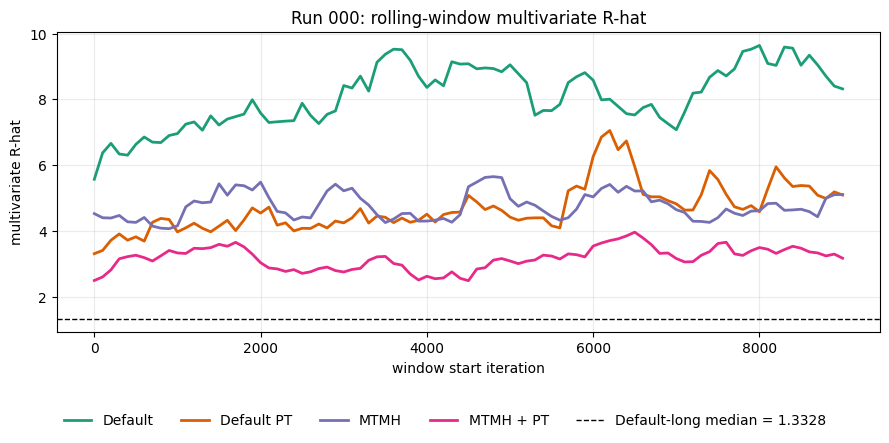

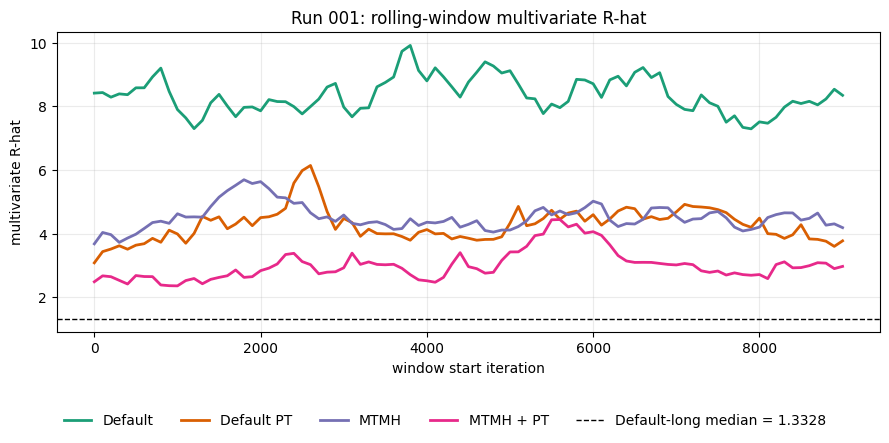

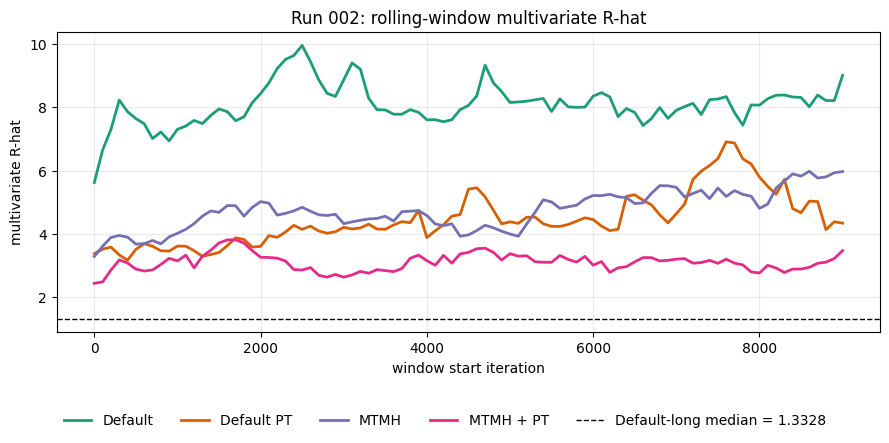

In [12]:
ROLLING_METHOD_COLORS = {
    "default": "#1b9e77",
    "default_pt": "#d95f02",
    "mtmh": "#7570b3",
    "mtmh_pt": "#e7298a",
}

rolling_rhat_rows = []
for run_id in SHORT_RUN_IDS:
    for method in SHORT_METHODS:
        preds, _ = _load_prediction_chains(BASE_STORE, DATA_TAG, run_id, method, burn_in=0)
        chain_draws = preds.transpose(0, 2, 1)
        if chain_draws.shape[0] != 4:
            raise ValueError(f"Expected four chains for {method}, run {run_id:03d}; found {chain_draws.shape[0]}.")

        window_starts = range(0, chain_draws.shape[1] - ROLLING_WINDOW + 1, ROLLING_STEP)
        for start in window_starts:
            window_draws = chain_draws[:, start : start + ROLLING_WINDOW, :]
            rolling_rhat_rows.append(
                {
                    "run": f"Run {run_id:03d}",
                    "method": _method_name(method),
                    "window_start": start,
                    "multivariate_rhat": _multivariate_rhat(window_draws),
                }
            )

rolling_rhat_df = pd.DataFrame(rolling_rhat_rows)
if rolling_rhat_df.empty:
    raise ValueError("No complete rolling windows were available.")

for run_label, run_df in rolling_rhat_df.groupby("run", sort=True):
    fig, ax = plt.subplots(figsize=(9, 4.5))
    for method in SHORT_METHODS:
        method_label = _method_name(method)
        method_df = run_df[run_df["method"] == method_label]
        ax.plot(
            method_df["window_start"],
            method_df["multivariate_rhat"],
            label=method_label,
            color=ROLLING_METHOD_COLORS[method],
            linewidth=2,
        )

    ax.axhline(RHAT_REFERENCE, color="black", linestyle="--", linewidth=1, label=f"Default-long median = {RHAT_REFERENCE:.4f}")
    ax.set_title(f"{run_label}: rolling-window multivariate R-hat")
    ax.set_xlabel("window start iteration")
    ax.set_ylabel("multivariate R-hat")
    ax.grid(alpha=0.25)
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(
        handles, labels, loc="lower center",
        bbox_to_anchor=(0.5, 0.01), ncol=5, frameon=False,
    )
    fig.tight_layout(rect=[0, 0.12, 1, 1])
    plt.show()

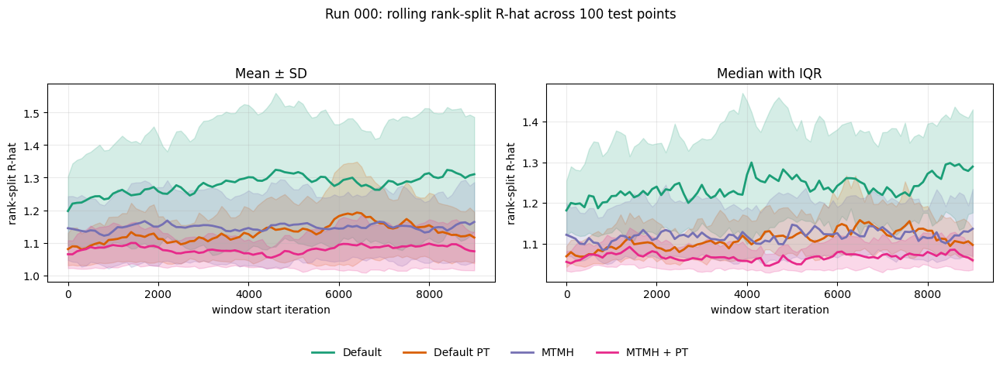

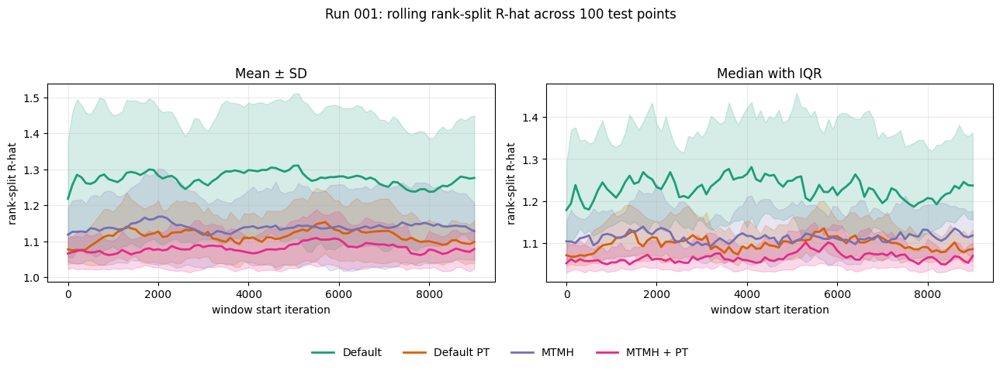

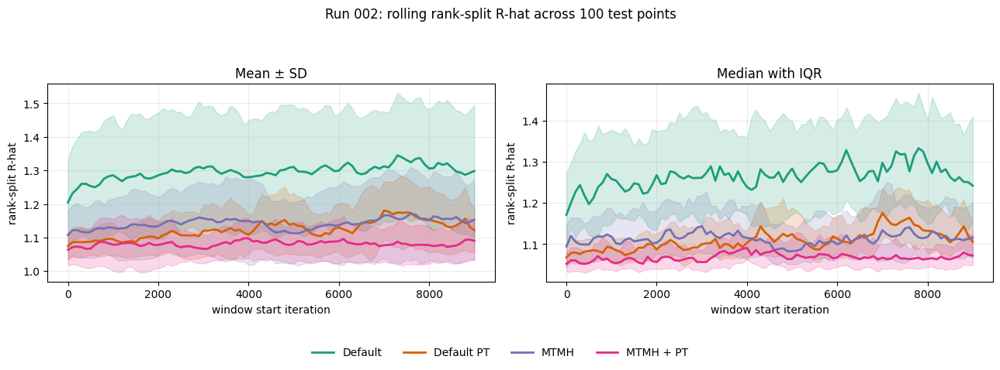

In [13]:
import arviz as az
import xarray as xr

pointwise_rolling_rhat_rows = []
for run_id in SHORT_RUN_IDS:
    for method in SHORT_METHODS:
        preds, _ = _load_prediction_chains(BASE_STORE, DATA_TAG, run_id, method, burn_in=0)
        chain_draws = preds.transpose(0, 2, 1)
        if chain_draws.shape[0] != 4:
            raise ValueError(f"Expected four chains for {method}, run {run_id:03d}; found {chain_draws.shape[0]}.")

        window_starts = range(0, chain_draws.shape[1] - ROLLING_WINDOW + 1, ROLLING_STEP)
        for start in window_starts:
            window_draws = chain_draws[:, start : start + ROLLING_WINDOW, :]
            window_da = xr.DataArray(
                window_draws,
                dims=("chain", "draw", "test_point"),
                coords={"test_point": np.arange(window_draws.shape[2])},
                name="prediction",
            )
            rhat_values = az.rhat(window_da, method="rank")["prediction"].values

            pointwise_rolling_rhat_rows.append(
                {
                    "run": f"Run {run_id:03d}",
                    "method": _method_name(method),
                    "window_start": start,
                    "rhat_mean": float(np.nanmean(rhat_values)),
                    "rhat_std": float(np.nanstd(rhat_values, ddof=1)),
                    "rhat_median": float(np.nanmedian(rhat_values)),
                    "rhat_q25": float(np.nanquantile(rhat_values, 0.25)),
                    "rhat_q75": float(np.nanquantile(rhat_values, 0.75)),
                }
            )

pointwise_rolling_rhat_df = pd.DataFrame(pointwise_rolling_rhat_rows)
if pointwise_rolling_rhat_df.empty:
    raise ValueError("No complete rolling windows were available for pointwise R-hat.")

for run_label, run_df in pointwise_rolling_rhat_df.groupby("run", sort=True):
    fig, axes = plt.subplots(1, 2, figsize=(13, 4.8), sharex=True)
    for method in SHORT_METHODS:
        method_label = _method_name(method)
        method_df = run_df[run_df["method"] == method_label].sort_values("window_start")
        x = method_df["window_start"].to_numpy()
        color = ROLLING_METHOD_COLORS[method]

        mean = method_df["rhat_mean"].to_numpy()
        std = method_df["rhat_std"].to_numpy()
        axes[0].plot(x, mean, label=method_label, color=color, linewidth=2)
        axes[0].fill_between(x, mean - std, mean + std, color=color, alpha=0.18)

        median = method_df["rhat_median"].to_numpy()
        q25 = method_df["rhat_q25"].to_numpy()
        q75 = method_df["rhat_q75"].to_numpy()
        axes[1].plot(x, median, label=method_label, color=color, linewidth=2)
        axes[1].fill_between(x, q25, q75, color=color, alpha=0.18)

    axes[0].set_title("Mean ± SD")
    axes[1].set_title("Median with IQR")
    for ax in axes:
        ax.set_xlabel("window start iteration")
        ax.set_ylabel("rank-split R-hat")
        ax.grid(alpha=0.25)

    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(
        handles, labels, loc="lower center",
        bbox_to_anchor=(0.5, 0.01), ncol=4, frameon=False,
    )
    fig.suptitle(f"{run_label}: rolling rank-split R-hat across 100 test points")
    fig.tight_layout(rect=[0, 0.12, 1, 0.92])
    plt.show()


# Worst-Direction Projection After Iteration 3000

For each run and method, the four chains after iteration 3000 are used to solve the same regularized generalized eigenvalue problem as MPSRF. The eigenvector associated with the largest eigenvalue is the prediction-space direction with the greatest between-chain variation relative to within-chain variation. All 100-dimensional draws are projected onto this direction and shown as four-chain trace and density plots.

The direction is estimated separately for each method, so the plots diagnose each method's worst chain-separation direction; cross-method comparison should use the reported maximum eigenvalue and projected rank-split R-hat rather than the raw projection scale.


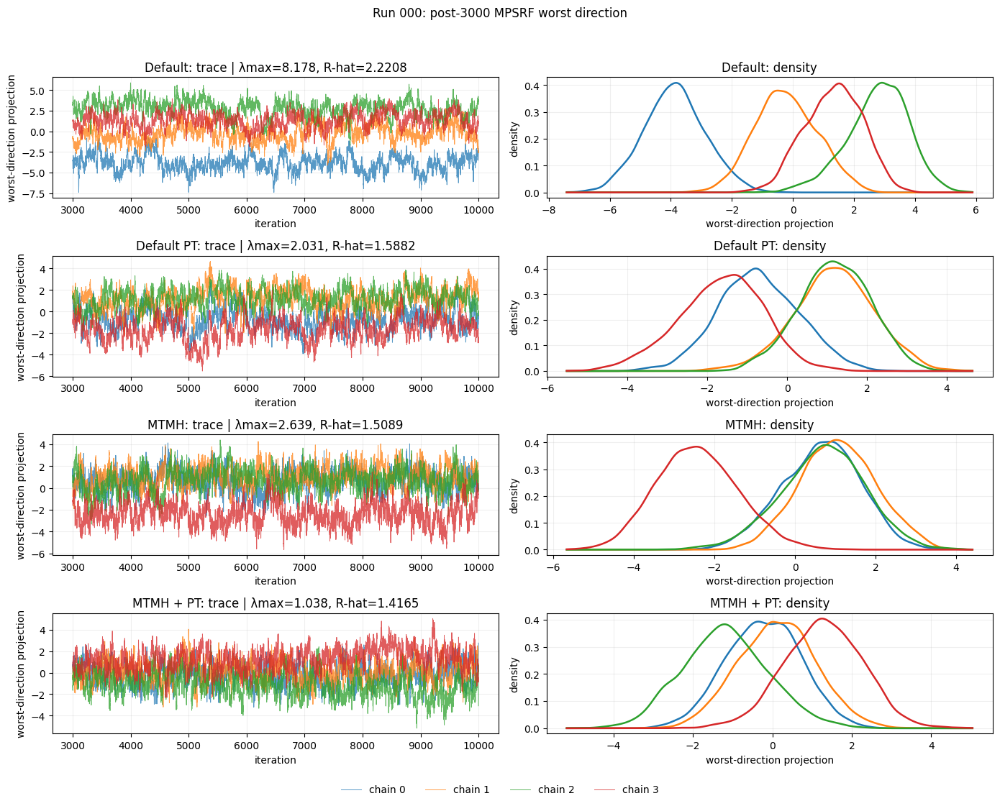

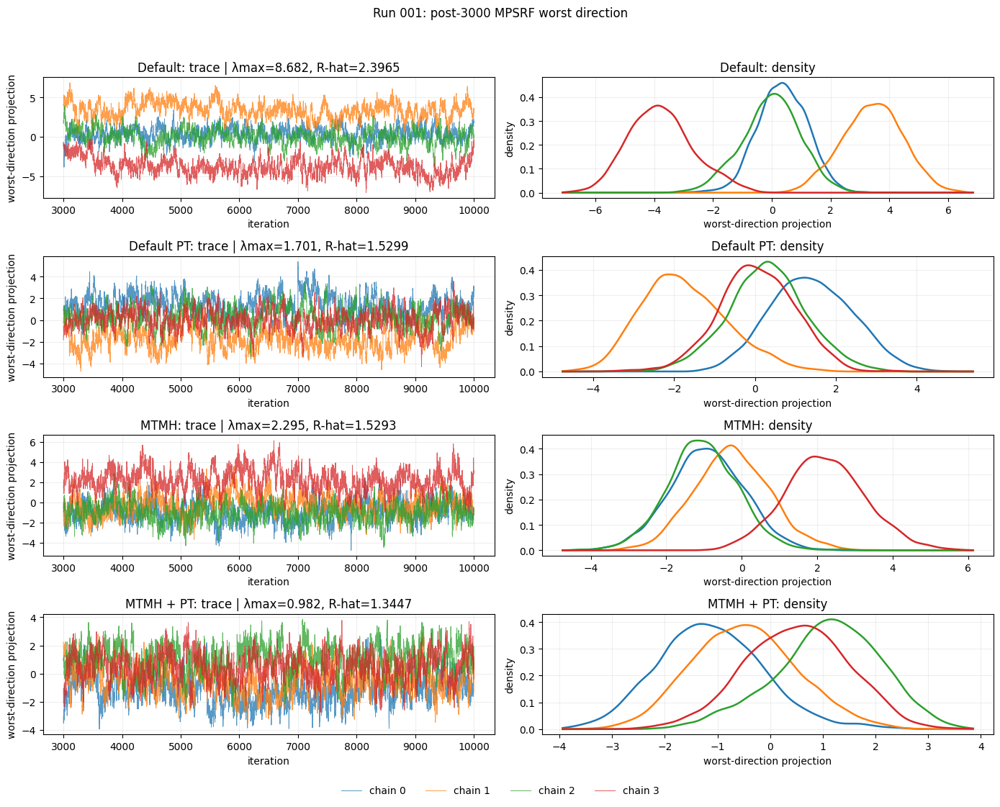

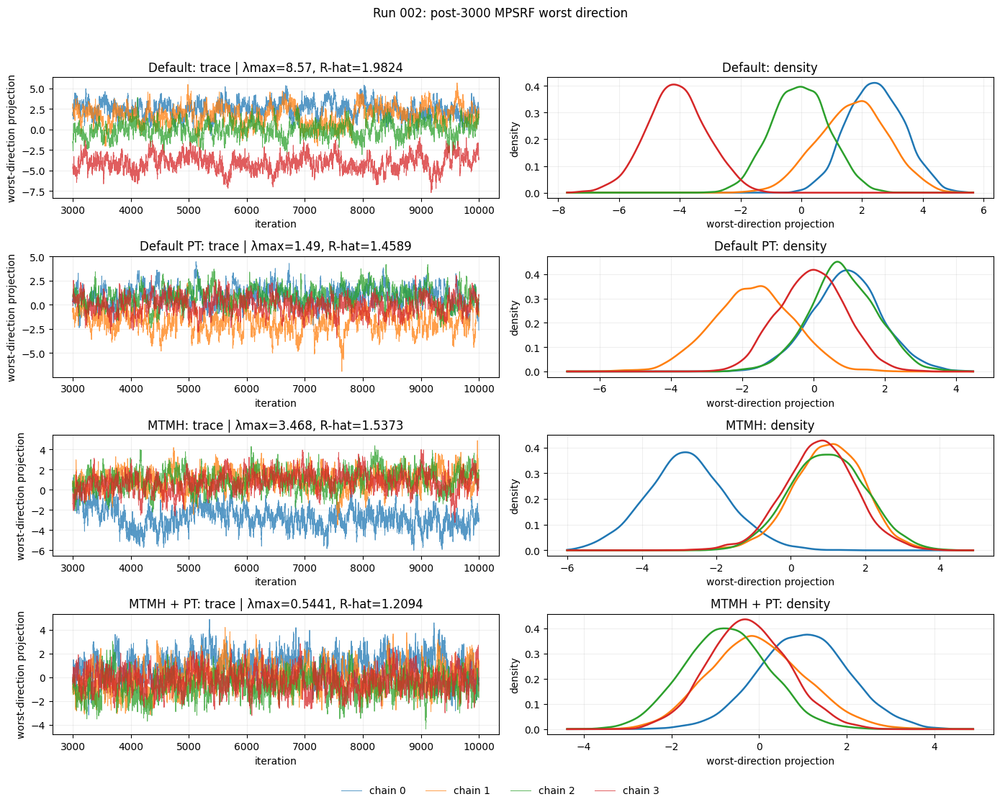

In [19]:
from scipy.linalg import eigh

EIGEN_PROJECTION_START = 3000
EIGEN_RIDGE_FRACTION = 1e-8
EIGEN_CHAIN_COLORS = ["#1f77b4", "#ff7f0e", "#2ca02c", "#d62728"]


def _worst_direction_projection(chain_draws, ridge_fraction=EIGEN_RIDGE_FRACTION):
    """Return the MPSRF worst direction and projections for (chain, draw, feature)."""
    chain_draws = np.asarray(chain_draws, dtype=float)
    if chain_draws.ndim != 3 or not np.all(np.isfinite(chain_draws)):
        raise ValueError("Expected a finite array with shape (chain, draw, feature).")

    n_chains, n_draws, n_features = chain_draws.shape
    if n_chains < 2 or n_draws < 2:
        raise ValueError("At least two chains and two draws per chain are required.")

    chain_means = chain_draws.mean(axis=1)
    grand_mean = chain_means.mean(axis=0)
    centered_within = chain_draws - chain_means[:, None, :]
    within = np.einsum(
        "mnp,mnq->pq", centered_within, centered_within, optimize=True
    ) / (n_chains * (n_draws - 1))

    mean_offsets = chain_means - grand_mean
    between_over_n = (mean_offsets.T @ mean_offsets) / (n_chains - 1)

    ridge = ridge_fraction * np.trace(within) / n_features
    if not np.isfinite(ridge) or ridge <= 0:
        ridge = ridge_fraction
    within_regularized = within + ridge * np.eye(n_features)

    eigenvalues, eigenvectors = eigh(
        between_over_n,
        within_regularized,
        check_finite=True,
    )
    direction = eigenvectors[:, -1]
    anchor = int(np.argmax(np.abs(direction)))
    if direction[anchor] < 0:
        direction = -direction

    lambda_max = max(0.0, float(eigenvalues[-1]))
    lambda_second = max(0.0, float(eigenvalues[-2])) if n_features > 1 else np.nan
    projected = (chain_draws - grand_mean) @ direction
    mpsrf = np.sqrt(
        (n_draws - 1) / n_draws
        + ((n_chains + 1) / n_chains) * lambda_max
    )
    projected_da = xr.DataArray(
        projected,
        dims=("chain", "draw"),
        name="worst_direction_projection",
    )
    projected_rhat = float(
        az.rhat(projected_da, method="rank")["worst_direction_projection"].values
    )

    return {
        "direction": direction,
        "projected": projected,
        "lambda_max": lambda_max,
        "eigen_gap": lambda_max - lambda_second,
        "mpsrf": float(mpsrf),
        "projected_rhat": projected_rhat,
    }


worst_direction_results = {}
worst_direction_rows = []

for run_id in SHORT_RUN_IDS:
    fig, axes = plt.subplots(
        len(SHORT_METHODS), 2,
        figsize=(14, 2.8 * len(SHORT_METHODS)),
        squeeze=False,
    )

    for row_id, method in enumerate(SHORT_METHODS):
        preds, _ = _load_prediction_chains(
            BASE_STORE, DATA_TAG, run_id, method, burn_in=0
        )
        if preds.shape[2] <= EIGEN_PROJECTION_START:
            raise ValueError(
                f"Run {run_id:03d}, {method} has only {preds.shape[2]} iterations."
            )
        chain_draws = preds[:, :, EIGEN_PROJECTION_START:].transpose(0, 2, 1)
        result = _worst_direction_projection(chain_draws)
        worst_direction_results[(run_id, method)] = result
        worst_direction_rows.append(
            {
                "run": f"Run {run_id:03d}",
                "method": _method_name(method),
                "lambda_max": result["lambda_max"],
                "eigen_gap": result["eigen_gap"],
                "mpsrf": result["mpsrf"],
                "projected_rhat": result["projected_rhat"],
            }
        )

        trace_ax, density_ax = axes[row_id]
        projected = result["projected"]
        iterations = np.arange(EIGEN_PROJECTION_START, preds.shape[2])
        density_x = np.linspace(np.min(projected), np.max(projected), 300)

        for chain_id in range(projected.shape[0]):
            color = EIGEN_CHAIN_COLORS[chain_id % len(EIGEN_CHAIN_COLORS)]
            label = f"chain {chain_id}"
            trace_ax.plot(
                iterations,
                projected[chain_id],
                color=color,
                linewidth=0.7,
                alpha=0.75,
                label=label,
            )
            try:
                kde = gaussian_kde(projected[chain_id])
                density_ax.plot(
                    density_x,
                    kde(density_x),
                    color=color,
                    linewidth=1.8,
                    label=label,
                )
            except Exception:
                density_ax.hist(
                    projected[chain_id],
                    bins=40,
                    density=True,
                    histtype="step",
                    color=color,
                    label=label,
                )

        method_label = _method_name(method)
        trace_ax.set_title(
            f"{method_label}: trace | λmax={result['lambda_max']:.4g}, "
            f"R-hat={result['projected_rhat']:.4f}"
        )
        density_ax.set_title(f"{method_label}: density")
        trace_ax.set_xlabel("iteration")
        trace_ax.set_ylabel("worst-direction projection")
        density_ax.set_xlabel("worst-direction projection")
        density_ax.set_ylabel("density")
        trace_ax.grid(alpha=0.2)
        density_ax.grid(alpha=0.2)

    handles, labels = axes[0, 0].get_legend_handles_labels()
    fig.legend(
        handles, labels,
        loc="lower center",
        bbox_to_anchor=(0.5, 0.005),
        ncol=4,
        frameon=False,
    )
    fig.suptitle(
        f"Run {run_id:03d}: post-{EIGEN_PROJECTION_START} MPSRF worst direction",
        y=0.995,
    )
    fig.tight_layout(rect=[0, 0.04, 1, 0.97])
    plt.show()

worst_direction_summary_df = pd.DataFrame(worst_direction_rows)


,method,lambda_median,lambda_q25,lambda_q75,projected_rhat_median,projected_rhat_q25,projected_rhat_q75,median_lambda_delta_vs_default
0,Default,8.56997,8.37395,8.62622,2.22083,2.10159,2.30868,0.00000
1,Default PT,1.70055,1.59537,1.86586,1.52990,1.49439,1.55904,-6.98193
2,MTMH,2.63930,2.46696,3.05381,1.52928,1.51906,1.53329,-5.53863
3,MTMH + PT,0.98201,0.76307,1.00985,1.34467,1.27703,1.38057,-7.70046


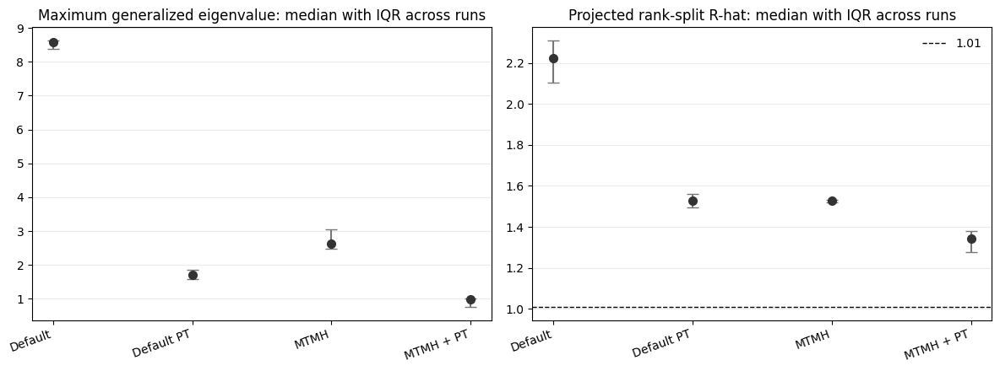

In [20]:
# Compact cross-run method comparison.
baseline_label = _method_name("default")
lambda_pivot = worst_direction_summary_df.pivot(
    index="run", columns="method", values="lambda_max"
)

comparison_rows = []
for method in SHORT_METHODS:
    method_label = _method_name(method)
    method_df = worst_direction_summary_df[
        worst_direction_summary_df["method"] == method_label
    ]
    lambda_values = method_df["lambda_max"].to_numpy()
    rhat_values = method_df["projected_rhat"].to_numpy()
    paired_delta = (
        lambda_pivot[method_label] - lambda_pivot[baseline_label]
    ).dropna()
    comparison_rows.append(
        {
            "method": method_label,
            "lambda_median": float(np.median(lambda_values)),
            "lambda_q25": float(np.quantile(lambda_values, 0.25)),
            "lambda_q75": float(np.quantile(lambda_values, 0.75)),
            "projected_rhat_median": float(np.median(rhat_values)),
            "projected_rhat_q25": float(np.quantile(rhat_values, 0.25)),
            "projected_rhat_q75": float(np.quantile(rhat_values, 0.75)),
            "median_lambda_delta_vs_default": float(np.median(paired_delta)),
        }
    )

worst_direction_comparison_df = pd.DataFrame(comparison_rows)
display(worst_direction_comparison_df.round(5))

fig, axes = plt.subplots(1, 2, figsize=(12, 4.5))
x = np.arange(len(worst_direction_comparison_df))
labels = worst_direction_comparison_df["method"].tolist()

for ax, metric, q25, q75, title in (
    (axes[0], "lambda_median", "lambda_q25", "lambda_q75", "Maximum generalized eigenvalue"),
    (axes[1], "projected_rhat_median", "projected_rhat_q25", "projected_rhat_q75", "Projected rank-split R-hat"),
):
    center = worst_direction_comparison_df[metric].to_numpy()
    lower = worst_direction_comparison_df[q25].to_numpy()
    upper = worst_direction_comparison_df[q75].to_numpy()
    ax.errorbar(
        x,
        center,
        yerr=np.vstack((center - lower, upper - center)),
        fmt="o",
        color="#333333",
        ecolor="#777777",
        capsize=5,
        markersize=7,
    )
    ax.set_xticks(x, labels, rotation=20, ha="right")
    ax.set_title(f"{title}: median with IQR across runs")
    ax.grid(axis="y", alpha=0.25)

axes[1].axhline(1.01, color="black", linestyle="--", linewidth=1, label="1.01")
axes[1].legend(frameon=False)
fig.tight_layout()
plt.show()


# Within-Chain Rolling R-hat

This section checks temporal stability within each original chain. A rolling block of 4000 consecutive draws is divided into four adjacent segments of 1000 draws, and those four segments are treated as pseudochains. The block moves forward in steps of 100 iterations. Results from the four original chains are retained separately rather than concatenated.

For the 100-dimensional predictions, rank-split R-hat is calculated pointwise. The plots show the mean with a ±1 standard-deviation band and the median with an interquartile-range band; MPSRF then evaluates the 100 test-point predictions jointly. Smaller values indicate that consecutive parts of the same chain have more similar distributions.

This is a within-chain stability diagnostic, not a replacement for ordinary cross-chain R-hat. A chain trapped in one mode may look stable across its own segments while disagreeing with other chains, so these plots must be interpreted together with the cross-chain diagnostics above.

All four chains are retained in the calculations, while each plot shows one reproducibly sampled original chain per run and method to reduce visual clutter.


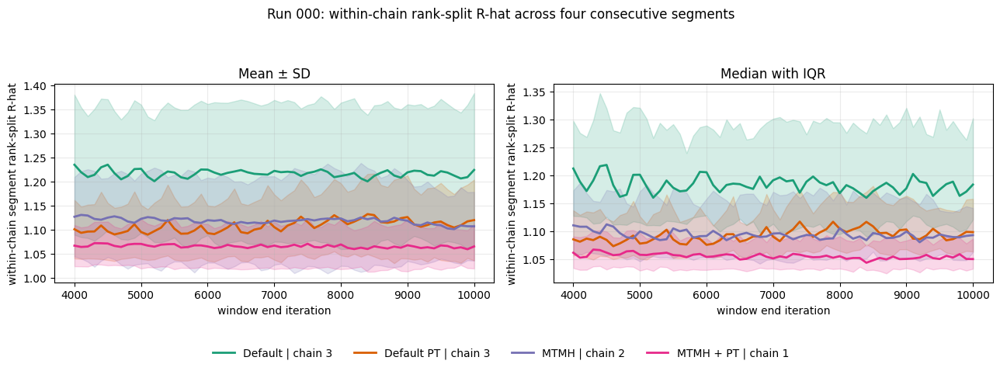

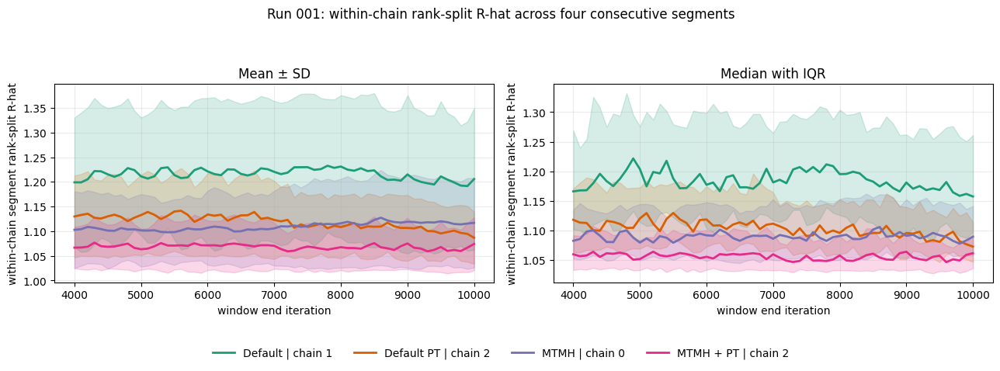

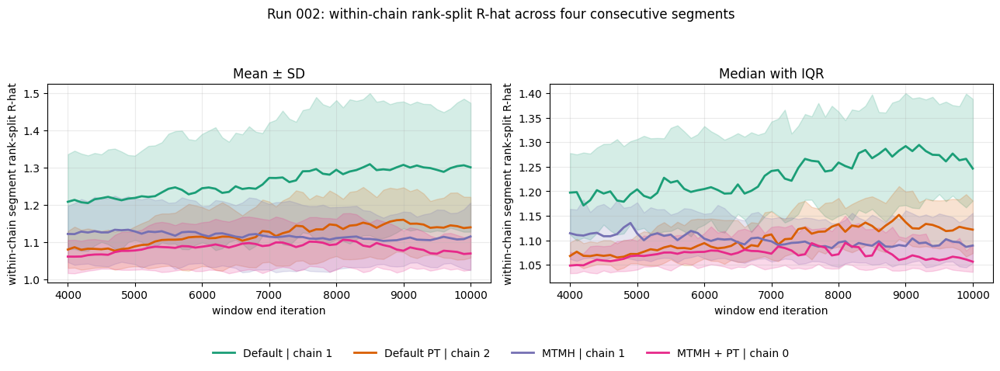

In [14]:
# Within-chain temporal stability: treat consecutive segments from one chain as pseudo-chains.
WITHIN_CHAIN_SEGMENT_LENGTH = 1000
WITHIN_CHAIN_N_SEGMENTS = 4
WITHIN_CHAIN_BLOCK = WITHIN_CHAIN_SEGMENT_LENGTH * WITHIN_CHAIN_N_SEGMENTS
WITHIN_CHAIN_STEP = 100

within_chain_segment_rhat_rows = []
for run_id in SHORT_RUN_IDS:
    for method in SHORT_METHODS:
        preds, _ = _load_prediction_chains(BASE_STORE, DATA_TAG, run_id, method, burn_in=0)
        chain_draws = preds.transpose(0, 2, 1)
        n_original_chains, n_draws, n_test_points = chain_draws.shape

        block_starts = range(0, n_draws - WITHIN_CHAIN_BLOCK + 1, WITHIN_CHAIN_STEP)
        for start in block_starts:
            block = chain_draws[:, start : start + WITHIN_CHAIN_BLOCK, :]
            segments = block.reshape(
                n_original_chains,
                WITHIN_CHAIN_N_SEGMENTS,
                WITHIN_CHAIN_SEGMENT_LENGTH,
                n_test_points,
            )
            pseudo_chains = segments.transpose(1, 2, 0, 3)
            segment_da = xr.DataArray(
                pseudo_chains,
                dims=("chain", "draw", "original_chain", "test_point"),
                coords={
                    "original_chain": np.arange(n_original_chains),
                    "test_point": np.arange(n_test_points),
                },
                name="prediction",
            )
            rhat_by_chain_and_point = az.rhat(segment_da, method="rank")["prediction"].values

            for chain_id in range(n_original_chains):
                rhat_values = rhat_by_chain_and_point[chain_id]
                within_chain_segment_rhat_rows.append(
                    {
                        "run": f"Run {run_id:03d}",
                        "method": _method_name(method),
                        "original_chain": chain_id,
                        "window_start": start,
                        "window_end": start + WITHIN_CHAIN_BLOCK,
                        "rhat_mean": float(np.nanmean(rhat_values)),
                        "rhat_std": float(np.nanstd(rhat_values, ddof=1)),
                        "rhat_median": float(np.nanmedian(rhat_values)),
                        "rhat_q25": float(np.nanquantile(rhat_values, 0.25)),
                        "rhat_q75": float(np.nanquantile(rhat_values, 0.75)),
                    }
                )

within_chain_segment_rhat_df = pd.DataFrame(within_chain_segment_rhat_rows)
if within_chain_segment_rhat_df.empty:
    raise ValueError("No complete within-chain segment windows were available.")

for run_label, run_df in within_chain_segment_rhat_df.groupby("run", sort=True):
    fig, axes = plt.subplots(1, 2, figsize=(13, 4.8), sharex=True)
    for method in SHORT_METHODS:
        method_label = _method_name(method)
        method_df = run_df[run_df["method"] == method_label]
        chain_id = _random_plot_chain_id(
            run_label, method, method_df["original_chain"].unique()
        )
        chain_df = method_df[
            method_df["original_chain"] == chain_id
        ].sort_values("window_end")
        x = chain_df["window_end"].to_numpy()
        color = ROLLING_METHOD_COLORS[method]
        label = f"{method_label} | chain {chain_id}"

        mean = chain_df["rhat_mean"].to_numpy()
        std = chain_df["rhat_std"].to_numpy()
        axes[0].plot(x, mean, label=label, color=color, linewidth=2)
        axes[0].fill_between(x, mean - std, mean + std, color=color, alpha=0.18)

        median = chain_df["rhat_median"].to_numpy()
        q25 = chain_df["rhat_q25"].to_numpy()
        q75 = chain_df["rhat_q75"].to_numpy()
        axes[1].plot(x, median, label=label, color=color, linewidth=2)
        axes[1].fill_between(x, q25, q75, color=color, alpha=0.18)

    axes[0].set_title("Mean ± SD")
    axes[1].set_title("Median with IQR")
    for ax in axes:
        ax.set_xlabel("window end iteration")
        ax.set_ylabel("within-chain segment rank-split R-hat")
        ax.grid(alpha=0.25)

    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(
        handles, labels, loc="lower center",
        bbox_to_anchor=(0.5, 0.01), ncol=4, frameon=False,
    )
    fig.suptitle(f"{run_label}: within-chain rank-split R-hat across four consecutive segments")
    fig.tight_layout(rect=[0, 0.12, 1, 0.92])
    plt.show()


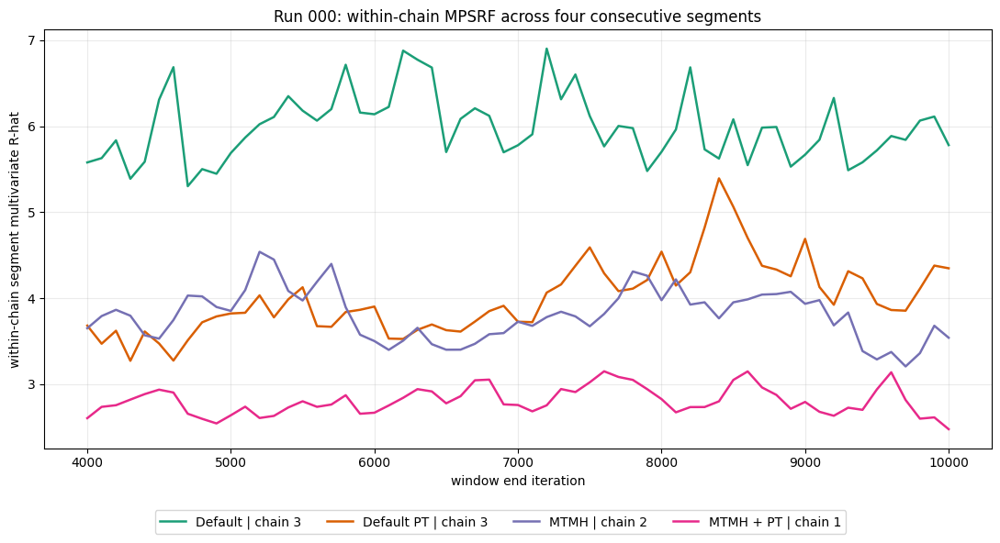

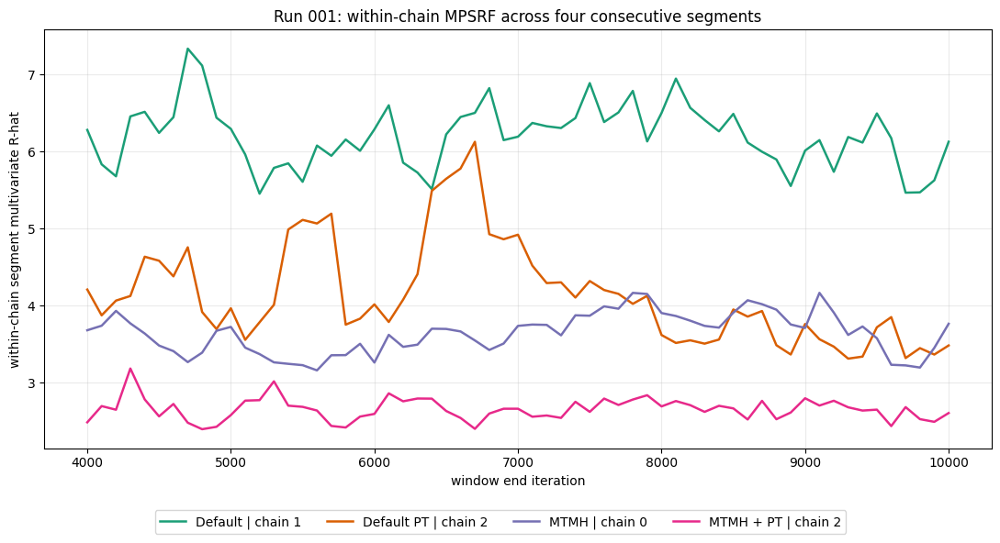

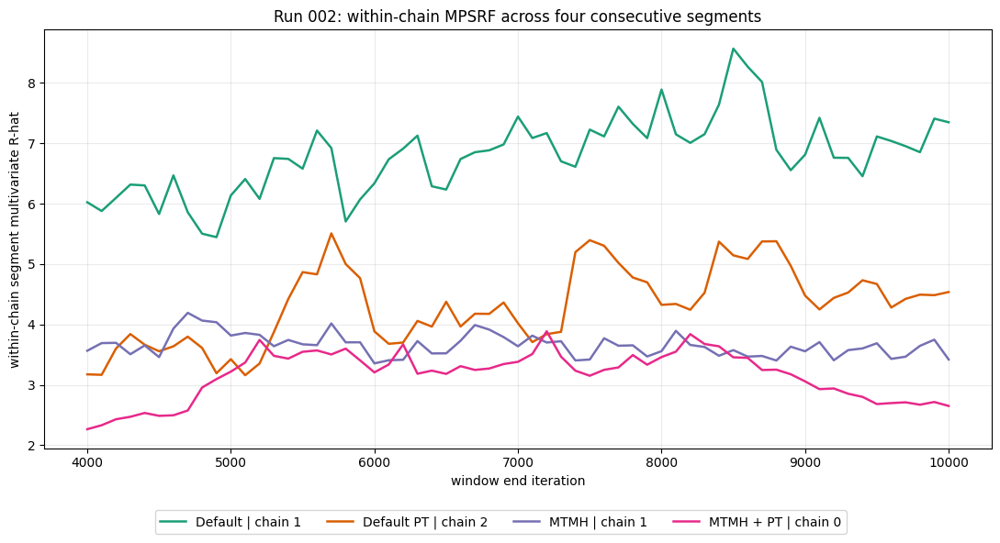

In [15]:
# Within-chain multivariate stability across the same four consecutive segments.
within_chain_segment_mpsrf_rows = []
for run_id in SHORT_RUN_IDS:
    for method in SHORT_METHODS:
        preds, _ = _load_prediction_chains(BASE_STORE, DATA_TAG, run_id, method, burn_in=0)
        chain_draws = preds.transpose(0, 2, 1)
        n_original_chains, n_draws, n_test_points = chain_draws.shape

        block_starts = range(0, n_draws - WITHIN_CHAIN_BLOCK + 1, WITHIN_CHAIN_STEP)
        for start in block_starts:
            block = chain_draws[:, start : start + WITHIN_CHAIN_BLOCK, :]
            segments = block.reshape(
                n_original_chains,
                WITHIN_CHAIN_N_SEGMENTS,
                WITHIN_CHAIN_SEGMENT_LENGTH,
                n_test_points,
            )

            for chain_id in range(n_original_chains):
                segment_mpsrf = _multivariate_rhat(segments[chain_id])
                within_chain_segment_mpsrf_rows.append(
                    {
                        "run": f"Run {run_id:03d}",
                        "method": _method_name(method),
                        "original_chain": chain_id,
                        "window_start": start,
                        "window_end": start + WITHIN_CHAIN_BLOCK,
                        "multivariate_rhat": segment_mpsrf,
                    }
                )

within_chain_segment_mpsrf_df = pd.DataFrame(within_chain_segment_mpsrf_rows)
if within_chain_segment_mpsrf_df.empty:
    raise ValueError("No complete within-chain segment windows were available for MPSRF.")

for run_label, run_df in within_chain_segment_mpsrf_df.groupby("run", sort=True):
    fig, ax = plt.subplots(figsize=(11, 6))
    for method in SHORT_METHODS:
        method_label = _method_name(method)
        method_df = run_df[run_df["method"] == method_label]
        chain_id = _random_plot_chain_id(
            run_label, method, method_df["original_chain"].unique()
        )
        chain_df = method_df[method_df["original_chain"] == chain_id]
        ax.plot(
            chain_df["window_end"],
            chain_df["multivariate_rhat"],
            color=ROLLING_METHOD_COLORS[method],
            linestyle="-",
            linewidth=1.8,
            label=f"{method_label} | chain {chain_id}",
        )

    ax.set_title(f"{run_label}: within-chain MPSRF across four consecutive segments")
    ax.set_xlabel("window end iteration")
    ax.set_ylabel("within-chain segment multivariate R-hat")
    ax.grid(alpha=0.25)
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc="lower center", bbox_to_anchor=(0.5, 0.01), ncol=4)
    fig.tight_layout(rect=[0, 0.08, 1, 1])
    plt.show()

# Rolling-Window Effective Sample Size

Using the same windows of 1000 draws moved in steps of 100, this section calculates rank-based bulk and tail effective sample sizes independently for each original chain. The four chains are never concatenated or passed together to the ESS estimator. Each ESS is divided by the chain length in the window (`ROLLING_WINDOW`, currently 1000), so the plots show relative ESS. Larger values mean that autocorrelation has reduced the information in that chain less severely.

Within each chain, the median relative prediction ESS describes a typical test point and the 5% quantile describes its poorly mixing test points without relying on a single extreme minimum. A value of 0.25 means that 1000 retained draws contain information comparable to about 250 independent draws. These values compare sampling efficiency per iteration, not per unit of wall-clock time.

All four chains are still analyzed independently, but each plot displays one reproducibly sampled chain per run and method. Method is encoded by color, and the selected chain number is included in the legend.


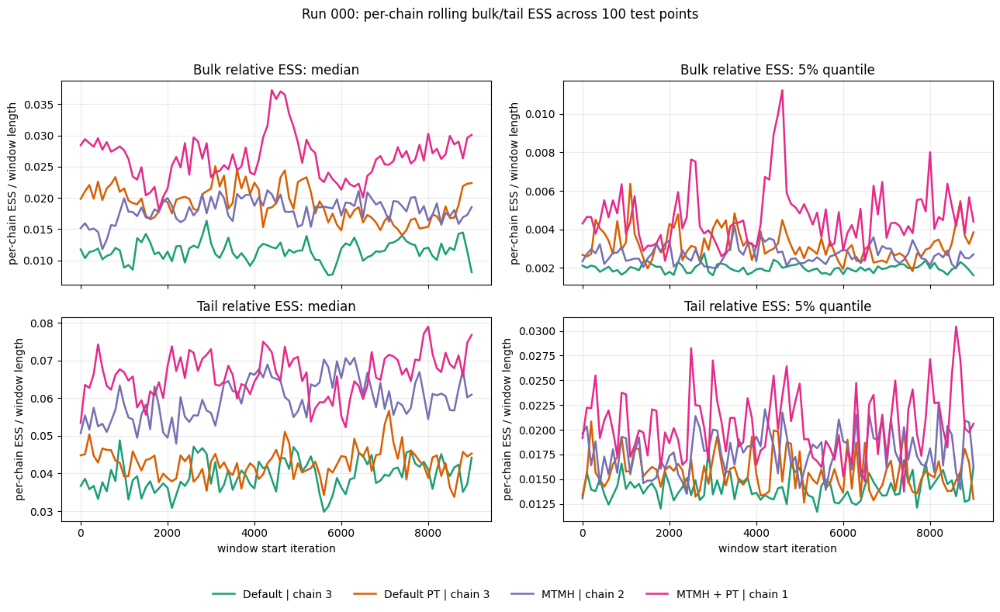

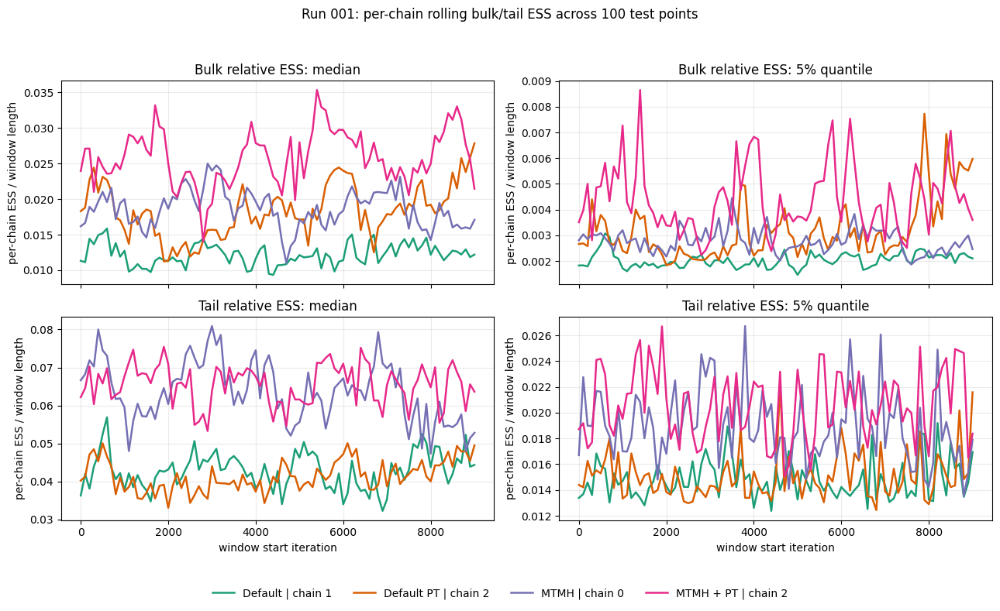

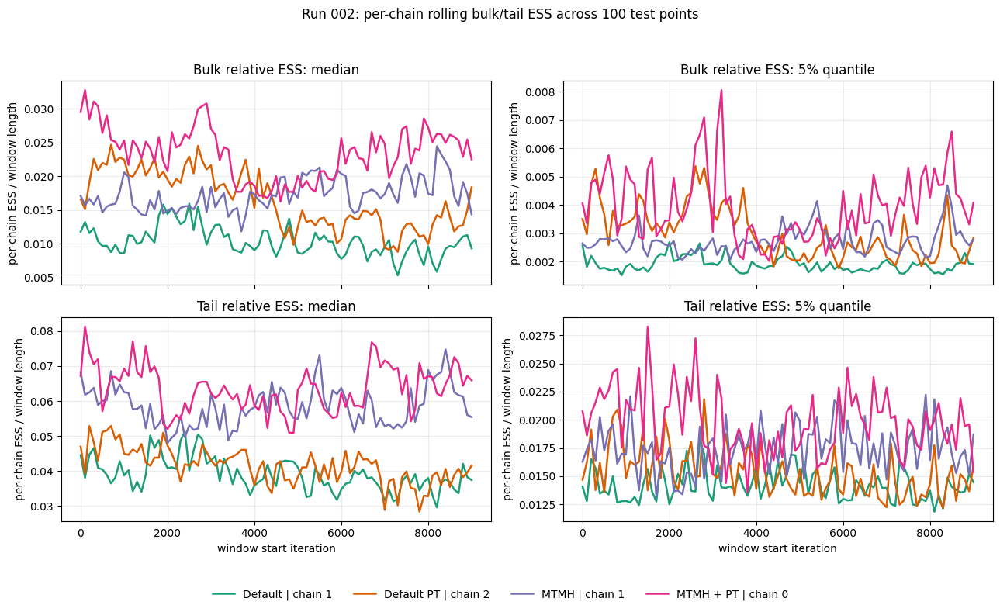

In [17]:
# Per-chain rolling bulk/tail ESS for the 100 test-point predictions.
PREDICTION_ESS_METRICS = {
    "bulk_ess_median": "Bulk relative ESS: median",
    "bulk_ess_q05": "Bulk relative ESS: 5% quantile",
    "tail_ess_median": "Tail relative ESS: median",
    "tail_ess_q05": "Tail relative ESS: 5% quantile",
}

rolling_prediction_ess_rows = []
for run_id in SHORT_RUN_IDS:
    for method in SHORT_METHODS:
        preds, _ = _load_prediction_chains(BASE_STORE, DATA_TAG, run_id, method, burn_in=0)
        chain_draws = preds.transpose(0, 2, 1)
        if chain_draws.shape[0] != 4:
            raise ValueError(f"Expected four chains for {method}, run {run_id:03d}; found {chain_draws.shape[0]}.")

        for start in range(0, chain_draws.shape[1] - ROLLING_WINDOW + 1, ROLLING_STEP):
            for chain_id in range(chain_draws.shape[0]):
                window_da = xr.DataArray(
                    chain_draws[chain_id : chain_id + 1, start : start + ROLLING_WINDOW, :],
                    dims=("chain", "draw", "test_point"),
                    coords={"test_point": np.arange(chain_draws.shape[2])},
                    name="prediction",
                )
                bulk_ess = az.ess(window_da, method="bulk")["prediction"].values / ROLLING_WINDOW
                tail_ess = az.ess(window_da, method="tail")["prediction"].values / ROLLING_WINDOW
                rolling_prediction_ess_rows.append(
                    {
                        "run": f"Run {run_id:03d}",
                        "method": _method_name(method),
                        "original_chain": chain_id,
                        "window_start": start,
                        "bulk_ess_median": float(np.nanmedian(bulk_ess)),
                        "bulk_ess_q05": float(np.nanquantile(bulk_ess, 0.05)),
                        "tail_ess_median": float(np.nanmedian(tail_ess)),
                        "tail_ess_q05": float(np.nanquantile(tail_ess, 0.05)),
                    }
                )

rolling_prediction_ess_df = pd.DataFrame(rolling_prediction_ess_rows)
if rolling_prediction_ess_df.empty:
    raise ValueError("No complete rolling windows were available for prediction ESS.")

for run_label, run_df in rolling_prediction_ess_df.groupby("run", sort=True):
    fig, axes = plt.subplots(2, 2, figsize=(13, 8), sharex=True)
    for ax, (metric, metric_label) in zip(axes.flat, PREDICTION_ESS_METRICS.items()):
        for method in SHORT_METHODS:
            method_label = _method_name(method)
            method_df = run_df[run_df["method"] == method_label]
            chain_id = _random_plot_chain_id(
                run_label, method, method_df["original_chain"].unique()
            )
            chain_df = method_df[method_df["original_chain"] == chain_id]
            ax.plot(
                chain_df["window_start"], chain_df[metric],
                label=f"{method_label} | chain {chain_id}",
                color=ROLLING_METHOD_COLORS[method],
                linestyle="-",
                linewidth=1.8,
            )
        ax.set_title(metric_label)
        ax.set_ylabel("per-chain ESS / window length")
        ax.grid(alpha=0.25)

    for ax in axes[-1, :]:
        ax.set_xlabel("window start iteration")
    handles, labels = axes[0, 0].get_legend_handles_labels()
    fig.legend(handles, labels, loc="lower center", bbox_to_anchor=(0.5, 0.01), ncol=4, frameon=False)
    fig.suptitle(f"{run_label}: per-chain rolling bulk/tail ESS across 100 test points")
    fig.tight_layout(rect=[0, 0.08, 1, 0.95])
    plt.show()